<font size="6"><b>[ML for NLP] Lecture 1C: Recap of Linear Algebra</b></font>

In this notebook we will recapitulate the main concepts of Linear Algebra, which are extensively used in ML. It covers:

1. [Vectors](#Vectors)
2. [Matrices](#Matrices)
3. [Linear Equations](#Linear-Equations)
4. [Vector Spaces](#Vector-Spaces)
5. [Trace](#Trace)
6. [Determinant](#Determinant)
7. [Eigenvalues and Eigenvectors](#Eigenvalues-and-Eigenvectors)
8. [Inverse Matrices](#Inverse-Matrices)
9. [Quadractic Form](#Quadractic-form)
10. [Positive Definite Matrices](#Positive-Definite-Matrices)
11. [Orthogonal Matrices](#Orthogonal-Matrices)
12. [Eigenvalue Value Decomposition (EVD)](#Eigenvalue-Value-Decomposition-(EVD))
13. [Singular Value Decomposition (SVD)](#Singular-Value-Decomposition-(SVD))
14. [Least Squares Estimation](#Least-Squares-Estimation)
15. [Least Norm Estimation](#Least-Norm-Estimation)

---

> Acknowledgments: This lecture is highly based on:
> - Introduction to Linear Algebra (2016) by Gilbert Strang
> - Probabilistic Machine Learning: An Introduction (2021) by Kevin Murphy
> - Lecture slides of the last LxMLS (http://lxmls.it.pt/), which were kindly provided by André Martins and Mário Figueiredo

---
### Basic imports

In [1]:
import numpy as np
import math
from matplotlib import pyplot as plt
from matplotlib.lines import Line2D
from functools import partial
from IPython.display import HTML
from celluloid import Camera

### Base MathJax
$\newcommand{\bm}[1]{{\boldsymbol{{#1}}}}$
$\DeclareMathOperator{\argmin}{argmin}$
$\DeclareMathOperator{\argmax}{argmax}$

In [2]:
%%html
<style>
.text-center{
    text-align: center;
}
.emphasis{
    font-size: 110%;
}
.visible{
    opacity: 1 !important;
}
.imgs{
    margin: 0px 10px;
}
.blue-box{
    text-align: left;
    color: black;
    padding: 10px 25px;
    background-color: #dbe7ff;
    border: 1px dashed #999;
    margin: 10px 0px;
    display: inline-block;
    clear: both;
    opacity: 0.2;
}
.red-box{
    text-align: left;
    color: black;
    padding: 10px 25px;
    background-color: #e6d5d5;
    border: 1px dashed #999;
    margin: 10px 0px;
    display: inline-block;
    clear: both;
    opacity: 0.2;
}
.green-box{
    text-align: left;
    color: black;
    padding: 10px 25px;
    background-color: #d5e6d8;
    border: 1px dashed #999;
    margin: 10px 0px;
    display: inline-block;
    clear: both;
    opacity: 0.2;
}
.blue-box:hover{
    opacity: 1.0;
}
.red-box:hover{
    opacity: 1.0;
}
.green-box:hover{
    opacity: 1.0;
}
.float-right{
    float: right;
}
.float-left{
    float: left;
}
.clear{
    clear: both;
}
</style>

### Base code for plotting

<AxesSubplot:>

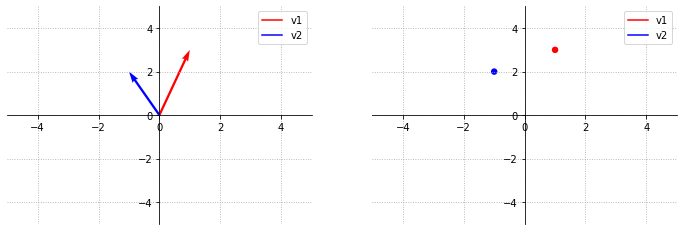

In [3]:
def stylize_plot(ax, xlim=(-5, 5), ylim=(-5, 5)):
    # plot grid with 0.9 opacity on all x and y ticks
    ax.grid(lw=0.9, linestyle=":", which='major')
    # limit view from min(x) to max(x) on x-axis (similarly for y)
    if xlim is not None:
        ax.set_xlim(*xlim)
    if ylim is not None:
        ax.set_ylim(*ylim)
    # remove top and right spines
    ax.spines['top'].set_color('none')
    ax.spines['right'].set_color('none')
    # center plot at origin
    ax.spines['left'].set_position('zero')
    ax.spines['bottom'].set_position('zero')
    return ax


def plot_vectors(
    *v, 
    origin=None, 
    color=None, 
    ax=None, 
    xlim=(-5, 5), 
    ylim=(-5, 5), 
    rep='arrow', 
    labels=None,
    loc='best',
    annotations=None,
    **kwargs
):
    if ax is None:
        fig, ax = plt.subplots(1,1)
    # stack vectors in v to create a matrix where each column is a vector
    vecs = np.vstack(v).T
    # origin coordinates
    if origin is None:
        origin = np.zeros_like(vecs)
    else:
        origin = np.array(origin).T
    if rep == 'arrow':
        # plot vectors as arrows from the origin
        ax.quiver(*origin, vecs[0], vecs[1], color=color, angles='xy', scale_units='xy', scale=1, **kwargs)
    else:
        # plot vectors as points on the plane
        ax.scatter(vecs[0], vecs[1], s=42, c=color, edgecolor='none', **kwargs)
    # plot legend
    if labels is not None:
        colors = [color] * len(labels) if isinstance(color, str) else color
        ax.legend(handles=[Line2D([0], [0], color=c, lw=1.5, label=l) 
                           for c, l in zip(colors, labels)], loc=loc)
    # define xlim and ylim automatically if not provided
    if xlim is None:
        xlim = (min(vecs[0])-1, max(vecs[0])+1)
    if ylim is None:
        ylim = (min(vecs[1])-1, max(vecs[1])+1)
    # do some stylizing
    stylize_plot(ax, xlim=xlim, ylim=ylim)
    # plot annotations if provided
    if annotations is not None:
        for text, x, y in zip(annotations, vecs[0], vecs[1]):
            ax.annotate(text, xy=(x - len(text)/10, y + 0.5), fontsize=14)
    return ax
    
# set plot
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

# create two vectors
v1 = np.array([1, 3])
v2 = np.array([-1, 2])

# plot them
plot_vectors(v1, v2, ax=axs[0], color=['r', 'b'], labels=['v1', 'v2'], rep='arrow')
plot_vectors(v1, v2, ax=axs[1], color=['r', 'b'], labels=['v1', 'v2'], rep='point')

<AxesSubplot:title={'center':'A•V'}>

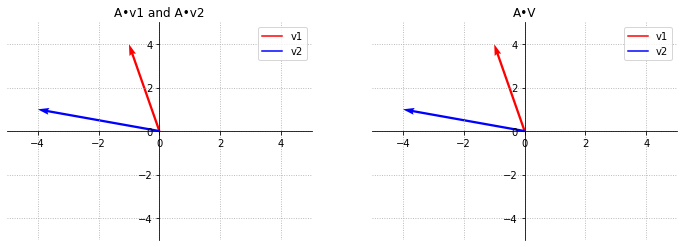

In [4]:
# set plot with two axes
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

# create a transformation matrix
A = np.array([[2, -1], [1, 1]])

# Matrix-vector multiplication
transf_v1 = A.dot(v1)
transf_v2 = A.dot(v2)

# plot
axs[0].set_title('A•v1 and A•v2')
plot_vectors(transf_v1, transf_v2, ax=axs[0], color=['r', 'b'], labels=['v1', 'v2'])

# this gives the same result:
V = np.vstack([v1, v2]).T
transf_vecs = A.dot(V)
axs[1].set_title('A•V')
plot_vectors(transf_vecs[:, 0], transf_vecs[:, 1], ax=axs[1], color=['r', 'b'], labels=['v1', 'v2'])

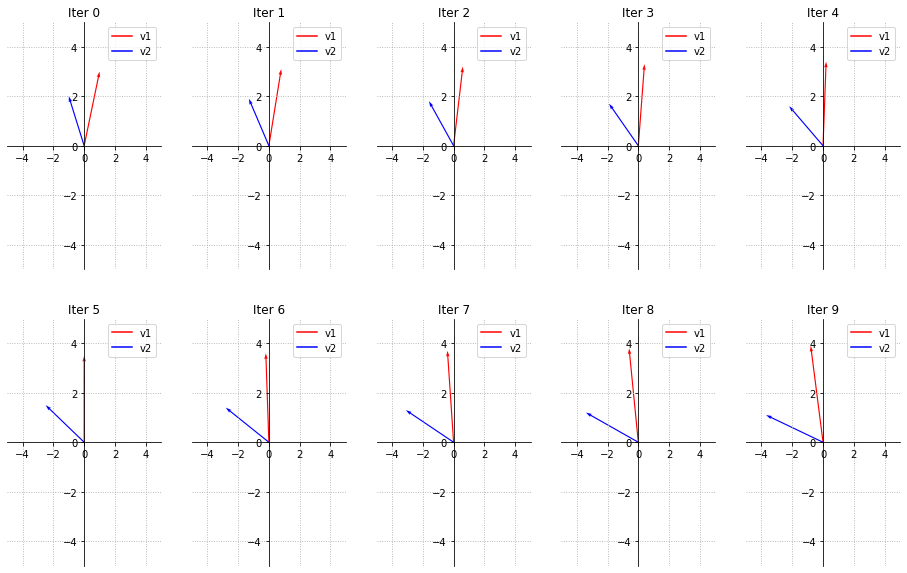

In [5]:
# set plot with 10 axes (2 rows and 5 columns)
fig, axs = plt.subplots(2, 5, figsize=(16, 10))

# let's plot the transformation A in 10 steps
n = 10
for i in range(n):
    # get axis
    ax = axs[i//5, i%5]
    
    # 2x2 identity matrix
    I = np.identity(A.ndim)
    
    # linear interpolation between V and AV (𝛼 = i/n): 
    # = 𝛼AV + (1 - 𝛼)IV
    # = (𝛼A + (1 - 𝛼)I)V
    # = (𝛼A + I - 𝛼I)V
    # = (I + 𝛼(A - I))V
    Ai = I + (i/n) * (A - I)
    transf_vecs = Ai.dot(V)
    
    # plot
    ax.set_title('Iter {}'.format(i))
    plot_vectors(transf_vecs[:, 0], transf_vecs[:, 1], 
                         color=['r', 'b'], labels=['v1', 'v2'], 
                         ax=ax)

In [6]:
def animate_vectors(V, A, fig=None, ax=None, n=10, draw_eigens=False, **kwargs):
    # stack V if it is a list of vectors
    if isinstance(V, (list, tuple)):
        V = np.vstack(V).T
    # get an axis object it it's None
    if ax is None:
        fig, ax = plt.subplots(1, 1)
    # track fig
    camera = Camera(fig)
    # a plot for each timestep
    for i in range(n+1):
        # linear interpolation between V and AV 
        I = np.identity(A.shape[-1])
        Ai = I + (i / n) * (A - I)
        transf_vecs = Ai.dot(V)
        # plot
        plot_vectors(*transf_vecs.T.tolist(), ax=ax, **kwargs)
        # draw eigenvectors
        if draw_eigens:
            evals, evecs = np.linalg.eig(A)
            if not np.iscomplex(evals).any():
                points = np.linspace(-100, 100, 3)
                evals_times_evecs = evals[None, :] * evecs
                for v in evals_times_evecs.T.tolist():
                    ax.plot(v[0] * points, v[1] * points, ls='--', color='k', alpha=0.3, linewidth=2) 
                plot_vectors(*evals_times_evecs.T, color=['k'], ax=ax, alpha=0.9, 
                             linestyle='dotted', facecolor='none', linewidth=2,
                             width=0.0001, headwidth=200, headlength=250)
        # add plot to animation
        camera.snap()
    # get animation with 100ms of interval
    animation = camera.animate(blit=False, interval=100, repeat_delay=1000)
    # close pyplot fig (we only need the animation by now)
    plt.close()
    # return animation in HTML format
    return animation.to_jshtml(default_mode='reflect')

# call animate function
HTML(animate_vectors(V, A, n=10, color=['r', 'b'], labels=['v1', 'v2']))

In [7]:
# lets plot multiple vectors!

# get a different rgb color for each (x, y) point
def colorizer(x, y, xmax, ymax):
    sigm = lambda z: 1 / (1 + np.exp(-z))
    c = np.array([sigm(x), 1 - sigm(x+y), sigm(y)])
    return c * 0.85

def plot_all_vectors(xmin=-10, xmax=10, ymin=-10, ymax=10, N=21, colorize=True, **kwargs):
    # N points from xmin to xmax (similarly for y)
    x = np.linspace(xmin, xmax, N)
    y = np.linspace(ymin, ymax, N)

    # create a meshgrid between x and y
    # X.shape is (21, 21) 
    # Y.shape is (21, 21) 
    X, Y = np.meshgrid(x, y)

    # flatten out to get vector
    V_all = np.vstack([X.flatten(), Y.flatten()])

    # get colors
    if colorize:
        colorizer_fn = partial(colorizer, xmax=max(abs(xmin), xmax), ymax=max(abs(ymin), ymax))
        color = list(map(colorizer_fn, V_all[0], V_all[1]))
    else:
        color = 'b'
    
    # plot
    return plot_vectors(*V_all.T.tolist(), color=color, 
                        xlim=kwargs.get('xlim', None), 
                        ylim=kwargs.get('ylim', None), 
                        **kwargs)

def animate_all_vectors(A, xmin=-10, xmax=10, ymin=-10, ymax=10, N=21, colorize=True, **kwargs):
    x = np.linspace(xmin, xmax, N)
    y = np.linspace(ymin, ymax, N)
    X, Y = np.meshgrid(x, y)
    V_all = np.vstack([X.flatten(), Y.flatten()])
    if colorize:
        colorizer_fn = partial(colorizer, xmax=max(abs(xmin), xmax), ymax=max(abs(ymin), ymax))
        color = list(map(colorizer_fn, V_all[0], V_all[1]))
    else:
        color = 'b'
    return animate_vectors(V_all, A, n=10, color=color, 
                           xlim=kwargs.get('xlim', None), 
                           ylim=kwargs.get('ylim', None), 
                           **kwargs)

<AxesSubplot:>

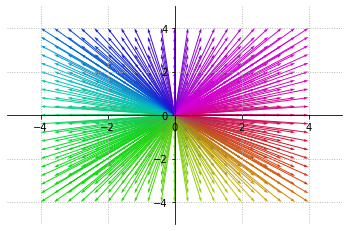

In [8]:
plot_all_vectors(xmin=-4, xmax=4, ymin=-4, ymax=4)

In [9]:
HTML(animate_all_vectors(A, xmin=-4, xmax=4, ymin=-4, ymax=4, N=11))

---

# Vectors

A **vector** $\bm{v} \in \mathbb{R}^n$ is a list of $n$ numbers. Mathematically we denote a vector as a **column vector**

$$
\bm{v} = \left[ \begin{array}{c}
v_1 \\
v_2 \\
\vdots \\
v_n
\end{array}\right]
$$

In code, we see vectors as arrays:

In [10]:
v = np.array([1, 1, 2, 5, 6])
print(v)
print(v.shape, v.dtype)

[1 1 2 5 6]
(5,) int64


In the heart of Linear Algebra lies two vector operations. We can

- add vectors: $\bm{v} + \bm{w}$
- multiply vectors by a scalar $c$: $c\bm{v}$

For example:
$$
3\bm{v} + 4\bm{w} = 
3 \left[ \begin{array}{c} 1 \\ 1 \end{array} \right] +
4 \left[ \begin{array}{c} 2 \\ 3 \end{array} \right] =
\left[ \begin{array}{c} 3 + 2\times 4 \\ 3 + 3\times 4 \end{array} \right] =
\left[ \begin{array}{c} 11 \\ 15 \end{array} \right]
$$


In [11]:
v = np.array([1, 1])
w = np.array([2, 3])
3 * v + 4 * w

array([11, 15])

### Scalar multiplication

For a scalar $c \in \mathbb{R}$, we get:

$$
c\bm{v} = c\left[ \begin{array}{c} v_1 \\ \vdots \\ v_n \end{array} \right] = \left[ \begin{array}{c} c v_1 \\ \vdots \\ c v_n \end{array} \right]
$$

The vector $c\bm{v}$ lies along a line. If the vector $\bm{w}$ does not lie on the same line as $c\bm{w}$, we fill the entire 2d plane.  Let's plot some vectors for different values of $c$:

<AxesSubplot:>

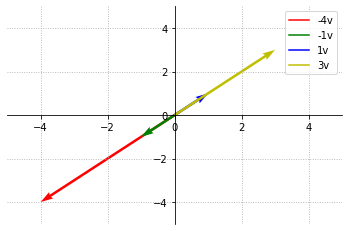

In [12]:
v = np.array([1, 1])
V = [c*v for c in [-4, -1, 1, 3]]
plot_vectors(V, color=['r', 'g', 'b', 'y'], labels=['%dv'%c for c in [-4, -1, 1, 3]])

### Vector addition
For two vectors $\bm{v} \in \mathbb{R}^n$ and $\bm{w} \in \mathbb{R}^n$, we have that:

$$
\bm{v} + \bm{w} = 
\left[ \begin{array}{c} v_1 \\ \vdots \\ v_n \end{array} \right] + 
\left[ \begin{array}{c} w_1 \\ \vdots \\ w_n \end{array} \right] =
\left[ \begin{array}{c} v_1 + w_1 \\ \vdots \\ v_n + w_n \end{array} \right]
$$

Let's see some examples:

<AxesSubplot:>

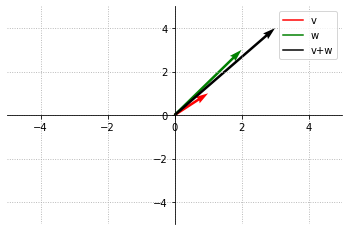

In [13]:
v = np.array([1, 1])
w = np.array([2, 3])
plot_vectors([v, w, v+w], color=['r', 'g', 'k'], labels=['v', 'w', 'v+w'])

Adding $\bm{x} + \bm{y}$ can be seen geometrically as the resulting vector of putting the tail of $\bm{y}$ on the head of $\bm{x}$, or tail of $\bm{x}$ on the head of $\bm{y}$. This creates a parallelogram:

<AxesSubplot:>

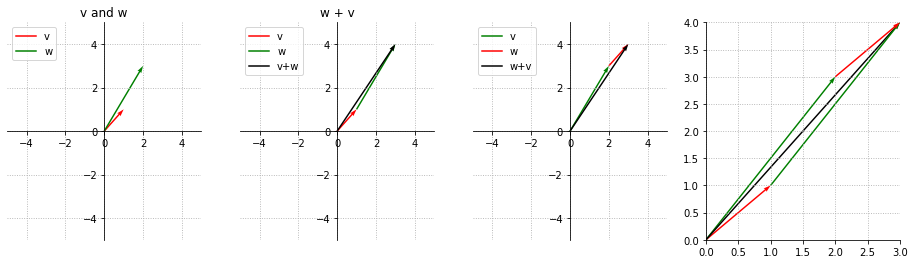

In [14]:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
o = np.array([0, 0])

axs[0].set_title('v and w')
plot_vectors([v, w], 
             color=['r', 'g'], 
             labels=['v', 'w'], 
             loc='upper left', 
             ax=axs[0])

axs[1].set_title('v + w')
plot_vectors([v, w, v+w], 
             origin=[o, v, o], 
             color=['r', 'g', 'k'], 
             labels=['v', 'w', 'v+w'], 
             loc='upper left', 
             ax=axs[1])

axs[1].set_title('w + v')
plot_vectors([w, v, w+v], 
             origin=[o, w, o], 
             color=['g', 'r', 'k'], 
             labels=['v', 'w', 'w+v'], 
             loc='upper left', 
             ax=axs[2])

plot_vectors([v, w, v+w, w, v], 
             origin=[o, o, o, v, w],
             color=['r', 'g', 'k', 'g', 'r'], 
             ax=axs[3], 
             xlim=(0, 3), 
             ylim=(0, 4))

$\bm{v} - \bm{w}$ works as $\bm{v} + (- \bm{w})$:

<AxesSubplot:>

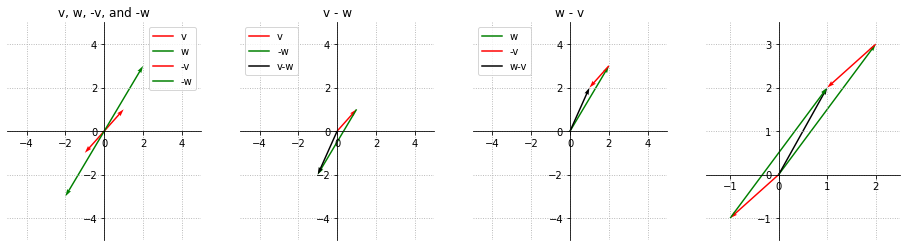

In [15]:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
o = np.array([0, 0])

axs[0].set_title('v, w, -v, and -w')
plot_vectors([v, w, -v, -w], 
             color=['r', 'g', 'r', 'g'], 
             labels=['v', 'w', '-v', '-w'], 
             ax=axs[0])

axs[1].set_title('v - w')
plot_vectors([v, -w, v-w], 
             origin=[o, v, o], 
             color=['r', 'g', 'k'], 
             labels=['v', '-w', 'v-w'], 
             loc='upper left', 
             ax=axs[1])

axs[2].set_title('w - v')
plot_vectors([w, -v, w-v], 
             origin=[o, w, o], 
             color=['g', 'r', 'k'], 
             labels=['w', '-v', 'w-v'], 
             loc='upper left', 
             ax=axs[2])

plot_vectors([-v, w, w-v, w, -v], 
             origin=[o, o, o, -v, w],
             color=['r', 'g', 'k', 'g', 'r'], 
             xlim=(-1.5, 2.5),
             ylim=(-1.5, 3.5),
             ax=axs[3])

<center>
    <b>Questions</b><br>
    (1) What picture do we get from all combinations of $c\bm{v}$?<br>
    (2) What picture do we get from all combinations of $c\bm{v} + d\bm{w}$ ?<br>
    (3) What picture do we get from all combinations of $c\bm{v} + d\bm{w} + e\bm{z}$?
</center>

### Dot Product

The dot product or inner product between $\bm{v} = [v_1, \cdots, v_n]$ and $\bm{w} = [w_1, \cdots, w_n]$ is defined as:

$$
\bm{v} \cdot \bm{w} = \bm{w}\cdot\bm{v} = v_1 w_1 + \cdots + v_n w_n 
$$

<br>
<center><b>The dot product is zero if and only if the two vectors are perpendicular</b></center>

For example:

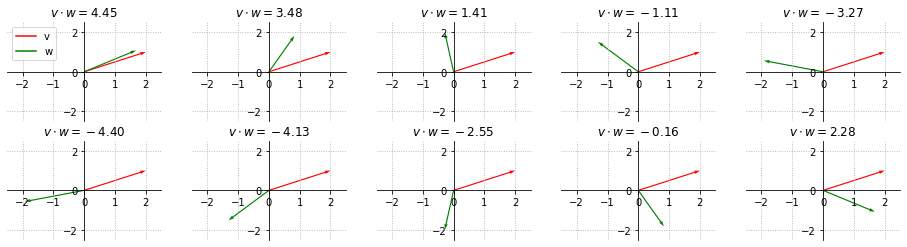

In [16]:
fig, axs = plt.subplots(2, 5, figsize=(16, 4))
for n in range(10):
    v = np.array([2, 1])
    # ccw rotation vector
    theta = 2 * np.pi * (n+1) / 11
    w = np.array([np.cos(theta), np.sin(theta)]) * 2  
    # recover ax and plot
    i, j = n // 5, n % 5
    axs[i,j].set_title('$v \cdot w = {:.2f}$'.format(np.dot(v, w)))
    plot_vectors([v, w], 
                 color=['r', 'g'], 
                 xlim=(-2.5, 2.5), 
                 ylim=(-2.5, 2.5), 
                 labels=['v', 'w'] if n == 0 else None, 
                 loc='upper left', 
                 ax=axs[i,j])

<center>
<b>Questions</b><br>
(1) What can we learn from these figures?<br>
(2) What happens when the dot product is positive? and negative?
</center>

Dot products enter in all types of science and are used by us in a daily basis. For example, suppose we own a cellphone shop and we have 3 smartphones to buy and sell. For each one, let $\bm{q} = [q_1, q_2, q_3]$ represent their unity, indicating how many we want to sell (positive) and to buy (negative). And let $\bm{p} = [p_1, p_2, p_3]$ represent their price. Our income is:

$$
\text{income} = \bm{q} \cdot \bm{p} = q_1 p_1 + q_2 p_2 + q_3 p_3
$$

What a income of zero represents?

### Length or Norm

To compute the length of a vector, we can invoke Pythagoras' theorem:

<AxesSubplot:>

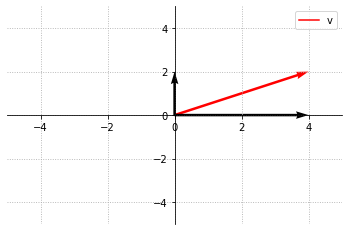

In [17]:
v = np.array([4, 2])
plot_vectors([v, [4, 0], [0, 2]], color=['r', 'k', 'k'], labels=['v'])

The length of $\bm{v}$ is defined as the square root of the dot product of $\bm{v}$ with itself:

$$
\|\bm{v}\| = \sqrt{\bm{v} \cdot \bm{v}} = \sqrt{v_1^2 + v_2^2 + \cdots + v_n^2}
$$

We also say that $\|\cdot\|$ is the **norm** of $\bm{v}$. In general, a p-norm is given by:

$$
\|\bm{v}\|_p = \left( \sum_i |v_i|^p \right)^{1/p}
$$

$p=2$ is a special case, and it is known as euclidian distance or $\ell_2$ norm. The $\ell_1$ norm is also a notable case, which is the sum of absolute values of $\bm{v}$.

### Unit vectors

Vectors whose length is equal to 1 are called **unit** vectors. Here are some examples:

$$
\bm{i} = \left[\begin{array}{c} 1 \\ 0\end{array}\right] \qquad 
\bm{j} = \left[\begin{array}{c} 0 \\ 1\end{array}\right] \qquad 
\bm{u} = \left[\begin{array}{c} \sin(\theta) \\ \cos(\theta)\end{array}\right]
$$

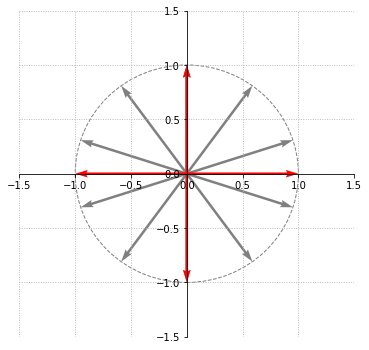

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))

theta = np.linspace(0, 2*np.pi, 11)
u = np.vstack([np.sin(theta), np.cos(theta)]).T

ax = plot_vectors([*u, [0, 1], [1, 0], [-1, 0], [0, -1]], 
                  xlim=(-1.5, 1.5), 
                  ylim=(-1.5, 1.5), 
                  color=['gray']*len(u) + ['r', 'r', 'r', 'r'],
                  ax=ax,
                  #labels=['u({:.2f})'.format(t) for t in theta] + ['i', 'j']
)
circle = plt.Circle(xy=(0, 0), radius=1, color='gray', ls='--', fill=False)
ax.add_patch(circle)

Any vector $\bm{v}$ can be normalized to be in the unit circle (sphere) by dividing it by its norm:

$$
\bm{u} = \frac{\bm{v}}{\|\bm{v}\|}
$$


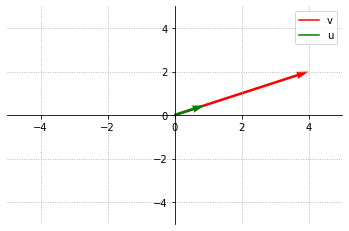

In [19]:
v = np.array([4, 2])
u = v / np.linalg.norm(v)
ax = plot_vectors([v, u], color=['r', 'g'], labels=['v', 'u'])

### Angle between vectors

We already know that $\bm{v} \cdot \bm{w} =0\iff \bm{v}$ and $\bm{w}$ are perpendicular, thus their angle is $\theta = 90^\circ$. In general, the angle between two vectors $\bm{v}$ and $\bm{w}$ is defined as:

$$
\cos\theta = \dfrac{\bm{v} \cdot \bm{w}}{\|\bm{v}\| \|\bm{w}\|}
$$


Since $|\cos\theta| \leq 1$, we get two important inequalities:

<center>

<div class="float-left">
<br><br>
$$
\begin{align}
\text{Cauchy–Schwarz inequality:} &\quad |\bm{v}\cdot\bm{w}| \leq \|\bm{v}\| \|\bm{w}\| \\
\\ \ 
\text{Triangle inequality:} &\quad \|\bm{v} + \bm{w}\| \leq \|\bm{v}\| + \|\bm{w}\| \qquad
\end{align}
$$
</div>

<img src="../figs/triangle_inequality.png" width="20%" class="float-left" />

</center>

<div class="clear"></div>

And also some other important equations:

$$
\begin{align}
\text{"Quadractic formula":} &\quad \|\bm{v} + \bm{w}\|^2 = \|\bm{v}\|^2 + 2\bm{v}\cdot\bm{w} + \|\bm{w}\|^2 \\
\\ \ 
\text{Cosine law:} &\quad \|\bm{v} - \bm{w}\|^2 = \|\bm{v}\|^2 - 2\|\bm{v}\|\|\bm{w}\|\cos\theta + \|\bm{w}\|^2 \\
\end{align}
$$

<br>
<center>
<div class="green-box">
<b>Where does $\cos\theta$ come from?</b>
<img src="../figs/angle_between_vectors.png" width="50%" />
    
From trignometry, we know that

$
\cos(\beta - \alpha) = \cos\beta \cos\alpha + \sin\beta \sin\alpha
$

The figure above shows

$
\begin{align}
\cos\alpha &= v_1/\|\bm{v}\| \\
\sin\alpha &= v_2/\|\bm{v}\| \\
\cos\beta &= w_1/\|\bm{w}\| \\
\sin\beta &= w_2/\|\bm{w}\| \\
\end{align}
$
    
Therefore, since $\theta = \beta - \alpha$:

$
\begin{align}
\cos(\beta - \alpha) &= \cos\beta \cos\alpha + \sin\beta \sin\alpha \\
\cos\theta &= \frac{w_1}{\|\bm{w}\|} \frac{v_1}{\|\bm{v}\|} + \frac{w_2}{\|\bm{w}\|} \frac{v_2}{\|\bm{v}\|} \\
           &= \frac{w_1 v_1 + w_2 v_2}{\|\bm{w}\| \|\bm{v}\|} \\
           &= \frac{\bm{w} \cdot \bm{v}}{\|\bm{w}\| \|\bm{v}\|}
\end{align}
$

</div>
</center>

Checking the formula using matplotlib:

42.27368900609373
42.27368900609373


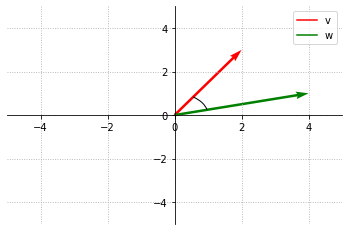

In [20]:
def angle(x, y): 
    return np.arccos(np.dot(x, y) / (np.linalg.norm(x) * np.linalg.norm(y)))

v = np.array([2, 3])
w = np.array([4, 1])
j = np.array([1, 0])  # unit vector
ax = plot_vectors([v, w], color=['r', 'g'], labels=['v', 'w'])

# find angle between j and w, and j and v
# and convert them from radians to degrees
theta1 = np.rad2deg(angle(j, w))
theta2 = np.rad2deg(angle(j, v))

# plot angle as an Arc()
# theta1: starting angle of the arc in degrees 
# theta2: ending angle of the arc in degrees 
from matplotlib.patches import Arc
arc = Arc([0, 0], 2, 2, angle=0, theta1=theta1, theta2=theta2)
ax.add_patch(arc)

# Check numbers (they should match)
print(theta2 - theta1)
print(np.rad2deg(angle(w, v)))

---

# Matrices

A matrix $\bm{A} \in \mathbb{R}^{m\times n}$ with $m$ rows and $n$ columns is a 2d array of numbers, arranged as follows:

$$
\bm{A} = \left[\begin{array}{ccc}
A_{1,1} & A_{1,2} & \cdots & A_{1,n} \\
A_{2,1} & A_{2,2} & \cdots & A_{2,n} \\
\vdots  & \vdots  & \ddots & \vdots \\
A_{m,1} & A_{m,2} & \cdots & A_{m,n}
\end{array}\right]
$$

If $m = n$, the matrix is said to be **square**. Some notation:
- $A_{i,j}$ denotes the scalar entry in the $i$th row and $j$th column. 
- $\bm{A}_{i,:}$ denotes the $i$th row as a column vector 
- $\bm{A}_{:,j}$ denotes the $j$th column as a column vector. 
- A **column vector** is a matrix with $n$ rows and $1$ column.
- A **row vector** is a matrix with $1$ row and $n$ columns.

We can view a matrix as a set of column vectors stacked horizontally (_this will be the standard view in this course_):

$$
\bm{A} = \left[\begin{array}{ccc}
|  & |  & | & | \\
\bm{A}_{:,1} & \bm{A}_{:,2} & \cdots & \bm{A}_{:,n} \\
|  & |  & | & | \\
\end{array}\right]
$$

Or a set of row vectors stacked vertically:
$$
\bm{A} = \left[\begin{array}{ccc}
- & \bm{A}_{m,1} & - \\
- & \bm{A}_{m,2} & - \\
- & \vdots & - \\
- & \bm{A}_{m,n} & -
\end{array}\right]
$$

In [21]:
A = np.array([[1, 0, 0], [-1, 1, 0], [0, -1, 1]])
print(A)
B = np.array([[1, 4, 3], [4, 2, 4], [3, 4, 1]])
print(B)

[[ 1  0  0]
 [-1  1  0]
 [ 0 -1  1]]
[[1 4 3]
 [4 2 4]
 [3 4 1]]


In [22]:
A[:, 1]

array([ 0,  1, -1])

In [23]:
A[0, :]

array([1, 0, 0])

### Transpose
The transpose of a matrix $\bm{A} \in \mathbb{R}^{m \times n}$ is written as $\bm{A}^\top \in \mathbb{R}^{n \times m}$, defined as:

$$
A_{i,j} = A_{j, i}
$$

In [24]:
A

array([[ 1,  0,  0],
       [-1,  1,  0],
       [ 0, -1,  1]])

In [25]:
A.T

array([[ 1, -1,  0],
       [ 0,  1, -1],
       [ 0,  0,  1]])

The following properties hold for the transpose operation:

- $(\bm{A}^\top)^\top = \bm{A}$
- $(\bm{A}\bm{B})^\top = \bm{B}^\top \bm{A}^\top$
- $(\bm{A} + \bm{B})^\top = \bm{A}^\top + \bm{B}^\top$

In [26]:
print(np.allclose(A, (A.T).T))
print(np.allclose(np.dot(A, B).T, np.dot(B.T, A.T)))
print(np.allclose((A + B).T, A.T + B.T))

True
True
True


If a **square matrix** satisfies $\bm{A} = \bm{A}^\top$, it is called **symmetric**. We denote the set of all symmetric matrices of size $n$ as $\mathbb{S}^n$.

In [27]:
print(B)
print(np.allclose(B, B.T))

[[1 4 3]
 [4 2 4]
 [3 4 1]]
True


### Tensors

Computationally speaking, a matrix with more than 2 axis is commonly known as a **tensor**. This figure illustrates the concept:

<img src="../figs/vector_vs_matrix_vs_tensor.png" width="40%" />

In code, we have:

In [28]:
x_vector = np.arange(64)
x_matrix = x_vector.reshape(8, 8)
x_tensor = x_vector.reshape(4, 4, 4)
print('Vector shape:', x_vector.shape)
print(x_vector)
print('---')
print('Matrix shape:', x_matrix.shape)
print(x_matrix)
print('---')
print('Tensor shape:', x_tensor.shape)
print(x_tensor)

Vector shape: (64,)
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
---
Matrix shape: (8, 8)
[[ 0  1  2  3  4  5  6  7]
 [ 8  9 10 11 12 13 14 15]
 [16 17 18 19 20 21 22 23]
 [24 25 26 27 28 29 30 31]
 [32 33 34 35 36 37 38 39]
 [40 41 42 43 44 45 46 47]
 [48 49 50 51 52 53 54 55]
 [56 57 58 59 60 61 62 63]]
---
Tensor shape: (4, 4, 4)
[[[ 0  1  2  3]
  [ 4  5  6  7]
  [ 8  9 10 11]
  [12 13 14 15]]

 [[16 17 18 19]
  [20 21 22 23]
  [24 25 26 27]
  [28 29 30 31]]

 [[32 33 34 35]
  [36 37 38 39]
  [40 41 42 43]
  [44 45 46 47]]

 [[48 49 50 51]
  [52 53 54 55]
  [56 57 58 59]
  [60 61 62 63]]]


---

# Linear Equations

The key problem of linear algebra is to solve a system of equations. For example:

$$
\begin{cases}
 \ \ x \quad - \quad 2y \quad = \quad 1 \\
 3x \quad + \quad 2y \quad = \quad 11
\end{cases}
$$

- Let's break this a row at a time.

$x - 2y = 1$ produces a line in the $xy$-plane. Just by looking at the equation we know that the point/vector $(1, 0)$ is somewhere in that line, since it solves the equation. The second equation also represents a line. 

Let's plot both of those lines to see if we can catch something.

<AxesSubplot:>

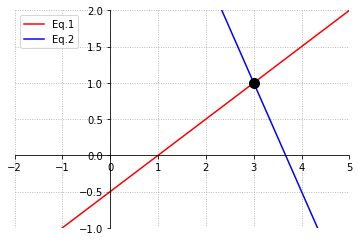

In [29]:
x = np.linspace(-5, 5, 3)
fig, ax = plt.subplots(1, 1)
ax.plot(x, x/2 - 1/2, 'r-', label='Eq.1')
ax.plot(x, -3*x/2 + 11/2, 'b-', label='Eq.2')
ax.legend()
ax.plot(3, 1, 'ko', markersize=10)
stylize_plot(ax, xlim=(-2, 5), ylim=(-1, 2))

The point $(3, 1)$ where the two lines cross cannot be missed. It represents the solution to our system of equations. 

This simple illustration gives us many clues on the possible problems that might arise when solving system of linear equations:

<br>
<center>
<b>Questions</b><br>
(1) What happens when the lines don't meet?<br>
(2) What happens when the lines are "linear dependent" (i.e. are on top of each other)?<br>
(3) What happens when one of the lines is a horizontal line? and a vertical line?
</center>

- Now, let's break the problem _a column at a time_.

This is Linear Algebra, so we need to see vectors instead of "numbers". So, let's separate the original system into columns:


$$
x \left[\begin{array}{c}1\\3\end{array}\right] + 
y \left[\begin{array}{c}-2\\2\end{array}\right] =
\left[\begin{array}{c}1\\11\end{array}\right] = \bm{b}
$$

Although this view is harder to interpret geometrically, it is much better overall when dealing with higher dimensions. It basically says "combine the column vectors on the left side to produce the vector on the right side". It is easy! On the other hand, it usually not straightforward to think how planes intersect in 3D, and things become insanely hard as we move to 4 or more dimensions.

In fact, all we have to do in the "columns" view is to **find the two scalars**, $x$ and $y$. Check the plot below to see a geometrical explanation.

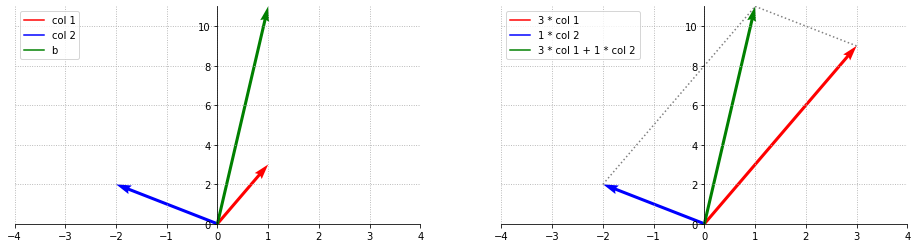

In [30]:
fig, axs = plt.subplots(1, 2, figsize=(16, 4))

col_1 = np.array([1, 3])
col_2 = np.array([-2, 2])
b = np.array([1, 11])
x = 3
y = 1

plot_vectors([col_1, col_2, b], 
             color=['r', 'b', 'g'], 
             labels=['col 1', 'col 2', 'b'],
             xlim=(-4, 4),
             ylim=(0, 11),
             loc='upper left',
             ax=axs[0])

plot_vectors([col_1 * x, col_2 * y, col_1 * x  + col_2 * y], 
             color=['r', 'b', 'g'], 
             labels=['3 * col 1', '1 * col 2', '3 * col 1 + 1 * col 2'],
             xlim=(-4, 4),
             ylim=(0, 11),
             loc='upper left',
             ax=axs[1])


axs[1].plot([-2, 1], [2, 11], ls=':', color='gray')
axs[1].plot([1, 3], [11, 9], ls=':', color='gray')

### Matrix-vector product

Furthermore, we can pack this operation into a multiplication between a coefficient matrix $\bm{A}$ and a vector of unknowns $\bm{x}$:

$$
\bm{A}\bm{x} = \bm{b}
$$

$$
\left[\begin{array}{cc}1 & -2 \\ 3 & 2 \\\end{array}\right]
\left[\begin{array}{c}x \\y\end{array}\right] =
\left[\begin{array}{c}1 \\11\end{array}\right]
$$

As we found out, $x=3$ and $y=1$:
$$
\left[\begin{array}{cc}1 & -2 \\ 3 & 2 \\\end{array}\right]
\left[\begin{array}{c}3 \\1\end{array}\right] =
\left[\begin{array}{c}1 \\11\end{array}\right]
$$

**Basic question: what does it mean to multiply a matrix times a vector?**
<font size="2">
> There are many possible answers depending on the "science" that we use to tackle this question. E.g., computational view, geometric view, etc. We'll see the first couple.
</font>

Computationally speaking, we can multiply them by rows or by columns.

<center>
<div class="blue-box text-center visible">
    <b><u>Multiplication by rows</u></b> <br>
$\bm{A}\bm{x}$ consists of dot products between each row and the vector $\bm{x}$:
    
$$
\bm{A}\bm{x} = \left[\begin{array}{c}
\mathbf{(row\ 1)} \cdot \bm{x} \\
\mathbf{(row\ 2)} \cdot \bm{x} \\
\vdots \\
\mathbf{(row\ n)} \cdot \bm{x}
\end{array}\right]
$$
</div>
</center>

In [31]:
A = np.array([[1, -2], [3, 2]])
x = np.array([3, 1])
np.array([
    A[0].dot(x),
    A[1].dot(x)
])

array([ 1, 11])

<center>
<div class="blue-box text-center visible">
    <b><u>Multiplication by columns</u></b> <br>
$\bm{A}\bm{x}$ is a linear combination of column vectors:
    
$$
\bm{A}\bm{x} = x_1\mathbf{(column\ 1)} + x_2\mathbf{(column\ 2)} + \cdots + x_n\mathbf{(column\ n)}
$$
</div>
</center>

In [32]:
A = np.array([[1, -2], [3, 2]])
x = np.array([3, 1])
A[:, 0] * x[0] + A[:, 1] * x[1]

array([ 1, 11])

In numpy, we can use the function `np.dot`, the method `.dot`, or the operator `@` for matrix-vector products

In [33]:
A = np.array([[1, -2], [3, 2]])
x = np.array([3, 1])
print(np.dot(A, x))
print(A.dot(x))
print(A @ x)

[ 1 11]
[ 1 11]
[ 1 11]


### Geometric interpretation

So far we have treated the matrix $\bm{A}$ as a set of vectors, and we have plotted the columns of our matrix to get a sense of what a linear system of equations represent. However, we can view a matrix-vector product as the matrix $\bm{A}$ **acting** on the vector $\bm{x}$ and transforming it to something else. 

Since this transformation is linear, we define this as a **linear map** or **linear transformation**. Concretely, a linear transformation is a function $f: \mathcal{V} \to \mathcal{W}$ that maps vectors from a basis $\mathcal{V}$ to another basis $\mathcal{W}$. In our examples, we will use $\mathcal{V} = \mathbb{R}^2$ and $\mathcal{W} = \mathbb{R}^2$ for convenience.

In [34]:
As = []
As.append(np.array([[2, 0], [1, 4]]))   # our previous example
As.append(np.array([[0, 1], [-1, 0]]))  # rotation matrix
As.append(np.array([[1, -2], [3, -6]])) # linear dependent matrix
As.append(np.random.randn(2, 2))        # random matrix

v1 = np.array([1, -1])
v2 = np.array([-2, 1])  
v3 = np.array([3, 1])

s = ''
for i in range(len(As)):
    A = As[i]
    fig, ax = plt.subplots(1, 1)
    ax.set_title(str(A))
    anims = animate_vectors([v1, v2, v3], A, 
                            color=['r', 'b', 'g'], 
                            labels=['v1', 'v2', 'v3'], 
                            xlim=(-6, 6), 
                            ylim=(-12, 12),
                            fig=fig,
                            ax=ax)
    
    s += '<div class="float-left">{}</div>'.format(anims)
    if i + 1 == len(As) // 2:
        s += '<div class="clear"></div>'

HTML(s)

Let's look at out previous example and see in detail what happens to the solution vector $\bm{v}_3 = [3, 1]$ as we progress in the linear transformation.

In [35]:
# our previous example
A = np.array([[1, -2], [3, 2]])
b = np.array([1, 11])
V = np.vstack([v1, v2, v3]).T  # stack vectors horizontally 

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
camera = Camera(fig)

n = 10
for i in range(n + 1):
    alpha = i / n
    I = np.identity(A.shape[-1])
    Ai = I + alpha * (A - I)
    transf_vecs = Ai.dot(V).T.tolist()
    _ = plot_vectors([b, *transf_vecs], 
                 color=['gray', 'r', 'b', 'g'], 
                 labels=['b', 'v1', 'v2', 'v3'],
                 xlim=(-4, 4),
                 ylim=(-12, 12),
                 ax=ax)
    camera.snap()

animation = camera.animate(blit=False, interval=100, repeat_delay=1000)
plt.close()
HTML(animation.to_jshtml(default_mode='reflect'))

<center>
<div class="blue-box visible">
This animation shows that $\bm{v}_3 = [3, 1]$ is a solution to the system of equations because it lands exactly on top of $\bm{b}$ after being transformed!
</div>
</center>

For a more "real" look of what is actually happening, we can also see **all vectors** simultaneously (but the plot looks more messy):

In [36]:
A = np.array([[1, -2], [3, 2]])
anim1 = animate_all_vectors(A, xmin=-3, xmax=3, ymin=-3, ymax=3, N=11)

A = np.array([[0, 1], [-1, 0]])
anim2 = animate_all_vectors(A, xmin=-3, xmax=3, ymin=-3, ymax=3, N=11)

s = '''
<div class="float-left">{}</div> 
<div class="float-left">{}</div>
'''.format(anim1, anim2)
HTML(s)

### Matrix Operations: scaling, addition, multiplication

If you've looked at our previous animations, you may have noticed that we stacked our vectors $\{\bm{v}_1,\bm{v}_2,\bm{v}_3\}$ into a matrix $\bm{V}$ in order to compute all matrix-vector products in parallel:

$
\bm{A}\bm{V} = \bm{A}
\left[\begin{array}{ccc}
| & | & | \\
\bm{v}_1 & \bm{v}_2 & \bm{v}_3 \\
| & | & | \\
\end{array}\right]
$

This is not just a computational trick. Instead, it is a way to view matrix-matrix multiplications. As with vectors, matrices can be added if their shapes match, and they can be scaled by a number $c$. For example:

$$
(\bm{A} + \bm{B}) \qquad
\left[\begin{array}{cc}
1 & 2 \\
3 & 4
\end{array}\right]
+
\left[\begin{array}{cc}
1 & 0 \\
2 & -1
\end{array}\right]
= 
\left[\begin{array}{cc}
2 & 2 \\
5 & 3
\end{array}\right]
$$

$$
(c\bm{A}) \qquad 
2 \left[\begin{array}{cc}
1 & 2 \\
3 & 4
\end{array}\right]
= 
\left[\begin{array}{cc}
2 & 4 \\
6 & 8
\end{array}\right]
$$

The hard questions arise for **matrix multiplication**.

### When can we multiply A and B?

To multiply $\bm{A}\bm{B}$, the matrix $\bm{A}$ must have $n$ columns and $\bm{B}$ must have $n$ rows. 

For example, if $\bm{A}$ is $m \times n$ and $\bm{B}$ if $n \times p$, we can multiply them. The result is a matrix with shape:

$$
(\bm{m} \times n)(n \times \bm{p}) = (\bm{m} \times \bm{p})
$$

For example, 
$$
\left[\begin{array}{cc}
1 & 2 \\
3 & 4 \\
2 & 2
\end{array}\right]
\left[\begin{array}{cccc}
5 & 7 & 6 & 0 \\
-1 & 4 & 5 & 9 \\
\end{array}\right]
=
\text{matrix with shape }(3 \times 4)
$$

In [37]:
A = np.array([[1, 2], [3, 4], [2, 2]])
B = np.array([[5, 7, 6, 0], [-1, 4, 5, 9]])
np.dot(A, B)

array([[ 3, 15, 16, 18],
       [11, 37, 38, 36],
       [ 8, 22, 22, 18]])

A column vector is as a $n \times 1$ matrix. Similarly, a row vector is a $1 \times n$ matrix. Therefore, matrix-vector product is a special case of matrix-matrix product.

In [38]:
v = np.array([2, 1])
v_row = np.expand_dims(v, axis=0)
v_col = np.expand_dims(v, axis=1)
print(v.shape, v_row.shape, v_col.shape)

(2,) (1, 2) (2, 1)


### How can we multiply A and B?

There are 4 different yet equivalent ways to view matrix multiplications.

(1) rows of $\bm{A}$ times columns of $\bm{B}$

$$
\bm{C} = \bm{A}\bm{B} = 
\left[\begin{array}{ccc}
- & \bm{a}_1 & - \\
- & \bm{a}_2 & - \\
- & \vdots & - \\
- & \bm{a}_m & -
\end{array}\right]
\left[\begin{array}{ccc}
|  & |  & | & | \\
\bm{b}_1 & \bm{b}_2 & \cdots & \bm{b}_p \\
|  & |  & | & | \\
\end{array}\right]
=
\left[\begin{array}{cccc}
\bm{a}_1 \cdot \bm{b}_1 & \bm{a}_1 \cdot \bm{b}_2 & \cdots & \bm{a}_1 \cdot \bm{b}_p \\
\bm{a}_2 \cdot \bm{b}_1 & \bm{a}_2 \cdot \bm{b}_2 & \cdots & \bm{a}_2 \cdot \bm{b}_p \\
\vdots & \vdots & \ddots & \vdots \\
\bm{a}_m \cdot \bm{b}_1 & \bm{a}_m \cdot \bm{b}_2 & \cdots & \bm{a}_m \cdot \bm{b}_p \\
\end{array}\right]
$$

This is the traditional view and is the way people usually remember ("row times colum").

(2) matrix-vector products between $\bm{A}$ and the columns of $\bm{B}$

$$
\bm{C} = \bm{A}\bm{B} = 
\bm{A}
\left[\begin{array}{ccc}
|  & |  & | & | \\
\bm{b}_1 & \bm{b}_2 & \cdots & \bm{b}_p \\
|  & |  & | & | \\
\end{array}\right]
=
\left[\begin{array}{ccc}
|  & |  & | & | \\
\bm{A}\bm{b}_1 & \bm{A}\bm{b}_2 & \cdots & \bm{A}\bm{b}_p \\
|  & |  & | & | \\
\end{array}\right]
$$

This is the view that we used before for applying $\bm{A}$ on a stack of vectors $\bm{B}$.

(3) matrix-vector products between $\bm{B}$ and the rows of $\bm{A}$

$$
\bm{C} = \bm{A}\bm{B} = 
\left[\begin{array}{ccc}
- & \bm{a}_1 & - \\
- & \bm{a}_2 & - \\
- & \vdots & - \\
- & \bm{a}_m & -
\end{array}\right]
\bm{B}
=
\left[\begin{array}{ccc}
- & \bm{a}_1 \bm{B} & - \\
- & \bm{a}_2 \bm{B} & - \\
- & \vdots & - \\
- & \bm{a}_m \bm{B} & -
\end{array}\right]
$$

This is an alternative view for the previous view.

(4) sum of columns of $\bm{A}$ times rows of $\bm{B}$

$$
\bm{C} = \bm{A}\bm{B} = 
\left[\begin{array}{ccc}
|  & |  & | & | \\
\bm{a}_1 & \bm{a}_2 & \cdots & \bm{a}_p \\
|  & |  & | & | \\
\end{array}\right]
\left[\begin{array}{ccc}
- & \bm{b}_1 & - \\
- & \bm{b}_2 & - \\
- & \vdots & - \\
- & \bm{b}_m & -
\end{array}\right]
=
\bm{a}_1 \otimes \bm{b}_1 + \bm{a}_2 \otimes \bm{b}_2 + \cdots + \bm{a}_n \otimes \bm{b}_n
$$

Where $\otimes$ represents the outer-product operation: matrix multiplication with shapes ($m \times 1$) and ($1 \times p$). Or, in vector notation:  $\bm{a}\bm{b}^\top$.


## Properties of matrix-matrix product

Matrix addition:
$$
\begin{align}
\text{commutative:} &\quad \bm{A}+\bm{B} = \bm{B}+\bm{A}
\\
\text{distributive:} &\quad c(\bm{A}+\bm{B}) = c\bm{A} + c\bm{B}
\\
\text{associative:} &\quad \bm{A}+(\bm{B}+\bm{C}) = (\bm{A}+\bm{B})+\bm{C}
\end{align}
$$

Matrix multiplication:
$$
\begin{align}
\text{not commutative (in general):} &\quad \bm{A}\bm{B} \neq \bm{B}\bm{A}
\\
\text{distributive from the left:} &\quad \bm{A}(\bm{B}+\bm{C}) = \bm{A}\bm{B} + \bm{A}\bm{C}
\\
\text{distributive from the right:} &\quad (\bm{B}+\bm{C})\bm{A} = \bm{B}\bm{A} + \bm{C}\bm{A}
\\
\text{associative law:} &\quad \bm{A}(\bm{B}\bm{C}) = (\bm{A}\bm{B})\bm{C}
\end{align}
$$

<br>
<center>
    <b>Questions</b><br>
    (1) What is $(\bm{A} + \bm{B})^2$?<br>
    (2) What is $\bm{A}^\top \bm{A}$? <br>
    (3) What is $\bm{A} \bm{A}^\top$? 
</center>



In [39]:
A = np.array([[3, 1], [2, 2]])
B = np.random.randn(2, 2)
C = np.random.randn(2, 2)

print(np.allclose(A.dot(B), B.dot(A)))
print(np.allclose(A.dot(B+C), A.dot(B) + A.dot(C)))
print(np.allclose(A.dot(B.dot(C)), (A.dot(B)).dot(C)))

False
True
True


### Power notation

$AA = A^2$

$AAA = A^3$

$\sqrt{A} = A^{1/2} = $ matrix $B$ that such that $B^2 = A$

In [40]:
from scipy.linalg import sqrtm
print(np.sqrt(A)) # element-wise sqrt
print(sqrtm(A))   # matrix sqrt

[[1.73205081 1.        ]
 [1.41421356 1.41421356]]
[[1.66666667 0.33333333]
 [0.66666667 1.33333333]]


### Computational complexity

The naive way to multiply two $n\times n$ matrices requires $O(n^3)$ operations. Interestingly, there are algorithms that can do this in $O(n^{2.37})$. See more [here](https://en.wikipedia.org/wiki/Computational_complexity_of_matrix_multiplication). 

> However, the constant coefficient hidden by the Big O notation is so large that these algorithms are only worthwhile for matrices that are too large to handle on present-day computers.

### Special Matrices

- **Diagonal matrix:** typically denoted as $\bm{D} = diag(d_1, d_2, ..., d_n)$, represents the following square matrix

$$
\left[\begin{array}{cccc}
d_1 & & & \\
    & d_2 & & \\
    & & \ddots & \\
    & & & d_n
\end{array}\right]
$$

In [41]:
np.diag([1, 2, 5])

array([[1, 0, 0],
       [0, 2, 0],
       [0, 0, 5]])

- **Identity matrix:** denoted as $\bm{I}$, represents the diagonal matrix with 1s on the diagonal and 0 elsewhere: $diag(1,1...,1)$. It is the neutral element of matrix multiplication:

$$
\bm{A}\bm{I} = \bm{I}\bm{A} = \bm{A}
$$

In [42]:
np.identity(3)

array([[1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.]])

- **Block diagonal matrix:** contains matrices on its diagonal and 0 elsewhere:

$$
\left[\begin{array}{cc}
\bm{A} & \\
       & \bm{B}
\end{array}\right]
$$

In [43]:
np.block([
    [np.diag([1, 2, 5]), np.zeros((3, 3))],
    [np.zeros((3, 3)),   np.identity(3)]
])

array([[1., 0., 0., 0., 0., 0.],
       [0., 2., 0., 0., 0., 0.],
       [0., 0., 5., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1.]])

- **Triangular matrix**: can be upper triangular matrix (has non-zero entries on and above the diagonal), or a lower triangular matrix (has non-zero entries on and below the diagonal)

$$
\bm{A}_{upper} = \left[\begin{array}{cccc}
A_{1,1} & A_{1,2} & \cdots & A_{1,n} \\
        & A_{2,2} & \cdots & A_{2,n} \\
        &         & \ddots & \vdots \\
        &         &        & A_{n,n} \\
\end{array}\right] \qquad
\bm{A}_{lower} = \left[\begin{array}{cccc}
A_{1,1} & & & \\
\cdots & \ddots & & \\
A_{n-1,1} & \cdots & A_{n-1, n-1} & \\
A_{n,1} & \cdots & A_{n, n-1} & A_{n,n} \\
\end{array}\right] 
$$

In [44]:
np.triu(np.arange(1, 10).reshape(3, 3))

array([[1, 2, 3],
       [0, 5, 6],
       [0, 0, 9]])

In [45]:
np.tril(np.arange(1, 10).reshape(3, 3))

array([[1, 0, 0],
       [4, 5, 0],
       [7, 8, 9]])

---
# Vector Spaces 

### Linear combination

We can view a vector $\bm{v}_i \in \mathbb{R}^m$ as a point in the $m$-dimensional Euclidean space. For example, for $m=2$ we have our $xy$-plane. 

A vector space is a collection of these vectors. As we saw, we can add them and also scale them by real numbers (scalars). By combining these two operations we get a **linear combination**:

$$
c_1 \bm{v}_1 + c_2 \bm{v}_2 + \cdots + c_n \bm{v}_n.
$$

These two simple operations allow us to create new points on the entire span of the set of vectors. Let $\bm{V} \in \mathbb{R}^{m \times n}$ be a stack of vectors concatenated horizontally and $\bm{c} \in \mathbb{R}^{n}$ a vector:

$$
\bm{V} = \left[\begin{array}{ccc}
|  & |  & | & | \\
\bm{v}_1 & \bm{v}_2 & \cdots & \bm{v}_n \\
|  & |  & | & | \\
\end{array}\right] \qquad
\bm{c} = \left[\begin{array}{c} c_1\\ \vdots \\ c_n \end{array}\right]
$$

Or in matrix notation:
$$
\bm{V}\bm{c} = c_1 \bm{v}_1 + c_2 \bm{v}_2 + \cdots + c_n \bm{v}_n
$$

### Linear independence

A set of vectors $\{\bm{v}_1, \bm{v}_2, \cdots, \bm{v}_n\}$ is **linearly independent** if it is impossible to represent any $\bm{v}_i$ as a **linear combination** of the other vectors $\bm{v}_j$ for $j\neq i$. Otherwise, we say that $\bm{v}_i$ is **linearly dependent**.

For example, let $\{\bm{v}_1, \bm{v}_2, \bm{v}_3\}$ be:

$$
\bm{v}_1 = \left[\begin{array}{c}1 \\ -1 \\ 2 \end{array}\right],
\qquad
\bm{v}_2 = \left[\begin{array}{c}1 \\ 2 \\ 3 \end{array}\right],
\qquad
\bm{v}_3 = \left[\begin{array}{c}4 \\ -1 \\ 9 \end{array}\right]
$$

We say that $\bm{v}_3$ is linearly dependent of $\bm{v}_1$ and $\bm{v}_2$, because:

$$
\begin{align}
\bm{v}_3 &= 3 \bm{v}_1 + 1 \bm{v}_2 
             = 3 \left[\begin{array}{c}1 \\ -1 \\ 2 \end{array}\right] + 1 \left[\begin{array}{c}1 \\ 2 \\ 3 \end{array}\right]
             = \left[\begin{array}{c}4 \\ -1 \\ 9 \end{array}\right]
\end{align}
$$

The concept also applies to matrices. The matrix $\bm{V}$ may or may not contain linear dependent column vectors.

### Span 

The span of a set of vectors $\{\bm{v}_1, \bm{v}_2, \cdots, \bm{v}_n\}$ is the set of all vectors that can be expressed as a linear combination of $\{\bm{v}_1, \bm{v}_2, \cdots, \bm{v}_n\}$. This notion is so important that we will put a box around it:

<center>
<div class="blue-box emphasis visible">
$$
\text{span}\big(\{\bm{v}_1, \bm{v}_2, \cdots, \bm{v}_n\}\big) = 
\big\{ 
\bm{w}: \bm{w} = c_1 \bm{v}_1 + c_2 \bm{v}_2 + \cdots + c_n \bm{v}_n, 
\quad c_i \in \mathbb{R}
\big\}
$$
</div>
</center>

or in matrix notation:
<center>
<div class="blue-box emphasis visible">
$$
\text{span}\big(\bm{V}\big) = 
\big\{ 
\bm{w}: \bm{w} = \bm{V}\bm{c}, 
\quad \bm{c} \in \mathbb{R}^n
\big\}
$$
</div>
</center>

If $\{\bm{v}_1, \bm{v}_2, \cdots, \bm{v}_n\}$ is a set of $n$ linearly independent vectors, then $span(\{\bm{v}_1, \bm{v}_2, \cdots, \bm{v}_n\}) = \mathbb{R}^n$.

Let's understand what this means in code. Our idea is:

1. Plot two non linearly independent unit vectors in 2d, $\bm{v}$ and $\bm{w}$
2. Plot their sum $\bm{u} = \bm{v} + \bm{w}$ and normalize $u = \frac{\bm{u}}{\|\bm{u}\|}$
3. Check that $\bm{u}$ lies on the circumference of the unit circle
4. Try to vary $\bm{w}$ such $\bm{w}$ is L.I. of $\bm{v}$ and that $\bm{u}$ lies in another location on the circumference the unit circle
5. If we succeed, then $span(\bm{v}, \bm{w}) = \mathbb{R}^2$ since we can always scale $\bm{u}$ by a positive constant $c$ in order to "expand" the unit circle from $0$ to $\infty$

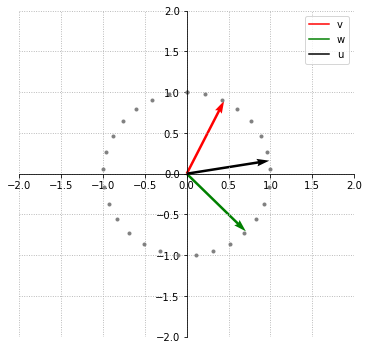

In [46]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))

# linearly dependent vectors (u is v1 + v2)
unit_vec = lambda v: v / np.linalg.norm(v)
v = unit_vec(np.array([1, 2]))
w = unit_vec(np.array([1, -1]))
u = unit_vec(v + w)

# plot v, w, and u
plot_vectors([v, w, u], 
             color=['r', 'g', 'k'], 
             labels=['v', 'w', 'u'],
             xlim=(-2, 2),
             ylim=(-2, 2),
             ax=ax)

# plot points on the circumference of the unit circle
n_points = 30
theta = np.linspace(0, 2*np.pi, n_points)
ax.plot(np.sin(theta), np.cos(theta), '.', color='gray')

In [47]:
# import libraries for animation
from celluloid import Camera
from IPython.display import HTML

# set plot and camera
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
camera = Camera(fig)

# for each point on the circ. of the unit circle
for x, y in zip(np.sin(theta), np.cos(theta)):
    # solve for w
    z = np.array((x, y))
    w = z - v
    u = v + w

    # plot unit circle
    ax.plot(np.sin(theta), np.cos(theta), '.', color='gray')
    
    # plot vectors
    plot_vectors([v, w, u], 
                 color=['r', 'g', 'k'], 
                 labels=['v', 'w', 'u'],
                 xlim=(-2, 2),
                 ylim=(-2, 2),
                 ax=ax)
    camera.snap()

# create animation and show the result
animation = camera.animate(blit=False, interval=100, repeat_delay=1000)
plt.close()
HTML(animation.to_jshtml(default_mode='reflect'))

<center>
    <b>Questions:</b><br>
    (1) What happens in the animation above if $\bm{w} = c\bm{v}$? <br>
    (2) Does our idea work for 3d? And for higher dimensions?
</center>

### Basis

A basis $\mathcal{B}$ is a set of linearly independent vectors that span the whole space:

$$
span(\mathcal{B}) = \mathbb{R}^n
$$

The **standard basis** uses the coordinate vectors $\bm{e}_1 = (1,0,\ldots,0)$, $\bm{e}_2 = (0,1,\ldots,0)$, up to $\bm{e}_n = (0,0,\ldots,0,1)$. In matrix notation, $\mathcal{B} = \bm{I}$ represents the standard basis.

For example, a vector $\bm{v} \in \mathbb{R}^2$ on the standard basis is computed as:

$$
\begin{align}
\bm{v} &= v_1 \bm{e}_1 + v_2 \bm{e}_2 \\
       &= \bm{I}\bm{v}
\end{align}
$$

Let's plot two xy-planes with different basis:

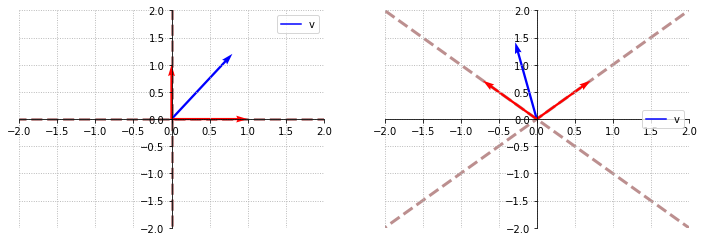

In [48]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

# standard basis
e1 = np.array([1, 0])
e2 = np.array([0, 1])
v = np.array([0.8, 1.2])
v = v[0]*e1 + v[1]*e2
plot_vectors([v, e1, e2], 
             color=['b', 'r', 'r'], 
             labels=['v'],
             xlim=(-2, 2),
             ylim=(-2, 2),
             ax=axs[0])

# plot basis
points = np.linspace(-4, 4, 3)
axs[0].plot(e1[0] * points, e1[1] * points, ls='--', color='rosybrown', linewidth=3, zorder=0)
axs[0].plot(e2[0] * points, e2[1] * points, ls='--', color='rosybrown', linewidth=3, zorder=0)

# non-standard basis
e1 = unit_vec(np.array([1, 1]))
e2 = unit_vec(np.array([-1, 1]))
v = np.array([0.8, 1.2])
v = v[0]*e1 + v[1]*e2
plot_vectors([v, e1, e2], 
             color=['b', 'r', 'r'], 
             labels=['v'],
             xlim=(-2, 2),
             ylim=(-2, 2),
             ax=axs[1])

# plot basis
points = np.linspace(-4, 4, 3)
axs[1].plot(e1[0] * points, e1[1] * points, ls='--', color='rosybrown', linewidth=3, zorder=0)
axs[1].plot(e2[0] * points, e2[1] * points, ls='--', color='rosybrown', linewidth=3, zorder=0)

### Range

The **range** (or **column space**) of a matrix $\bm{A} \in \mathbb{R}^{m \times n}$ is the span of its columns:

$$
\text{range}(\bm{A}) := \big\{ \bm{v} \in \mathbb{R}^m : \bm{v} = \bm{A}\bm{x}, \bm{x} \in \mathbb{R}^n \big\}
$$

In other words, the range of $\bm{A}$ is a set composed of vectors that can be generated by $\bm{A}$.


### Nullspace

The **nullspace** of a matrix $\bm{A} \in \mathbb{R}^{m \times n}$ is the set of vectors that are transformed to the null vector $\bm{0}$:

$$
\text{nullspace}(\bm{A}) := \big\{ \bm{x} \in \mathbb{R}^n : \bm{A}\bm{x} = \bm{0} \big\}
$$



### Rank

The **column rank** of a matrix $\bm{A}$ is the dimension of the space spanned by its columns, or the number of linearly independent columns. Analogously, the **row rank** is the dimension of the space spanned by its rows, or the number of linearly independent rows. It is a known fact that:

$$
\text{rank}(\bm{A}) = \text{column-rank}(\bm{A}) = \text{row-rank}(\bm{A})
$$

Therefore, this number is just called as the **rank** of $\bm{A}$. Here are a few properties of the rank for a matrix $\bm{A} \in \mathbb{R}^{m \times n}$:


- $\text{rank}(\bm{A}) \leq \min(m, n)$
    - $\text{rank}(\bm{A}) = \min(m, n) \iff \bm{A} \text{ is full rank}$
    - $\text{rank}(\bm{A}) < \min(m, n) \iff \bm{A} \text{ is rank deficient}$
<br><br>
- $\text{rank}(\bm{A}) = \text{rank}(\bm{A^\top}) = \text{rank}(\bm{A}^\top\bm{A}) = \text{rank}(\bm{A}\bm{A}^\top)$
<br><br>
- For $\bm{B} \in \mathbb{R}^{n \times p}$, $\text{rank}(\bm{A}\bm{B}) = \min(\text{rank}(\bm{A}), \text{rank}(\bm{B}))$
<br><br>
- For $\bm{B} \in \mathbb{R}^{m \times n}$, $\text{rank}(\bm{A} + \bm{B}) = \text{rank}(\bm{A}) + \text{rank}(\bm{B})$
<br><br>
- The four cases are 
    - $\text{rank}(\bm{A}) = m = n \qquad\qquad\quad$ ($\bm{A}\bm{x} =\bm{b}$ has 1 solution)
    - $\text{rank}(\bm{A}) = m < n \qquad\qquad\quad$ ($\bm{A}\bm{x} =\bm{b}$ has $\infty$ solutions)
    - $\text{rank}(\bm{A}) = n < m \qquad\qquad\quad$ ($\bm{A}\bm{x}=\bm{b}$ has 1 or O solutions)
    - $\text{rank}(\bm{A}) < m$ and $\text{rank}(\bm{A}) < n\ \ $ ($\bm{A}\bm{x} =\bm{b}$ has 0 or $\infty$ solutions)
<br><br>
- $\text{rank}(\bm{A}) = \text{dim}(\text{range}(\bm{A}))$
<br><br>
- $n = \text{rank}(\bm{A}) + \text{dim}(\text{nullspace}(\bm{A}))$


<!-- 
### Orthogonality of vector spaces

We already know that two vectors are orthogonal when their dot product is zero: $\bm{v}\cdot\bm{w} = \bm{v}^\top\bm{w} = 0$. Moreover, if they are orthogonal, then $\|\bm{v}+\bm{w}\| = \|\bm{v} - \bm{w}\| = \|\bm{v}\| + \|\bm{w}\|$.

<img src="./linear_algebra_big_picture.png" width="65%" /> 
-->


<center>
    <b>Questions:</b><br>
    (1) Suppose $\bm{A}\bm{x} = \bm{b}$ and $\bm{C}\bm{x} = \bm{b}$ have same solutions for every $\bm{b}$. Is it true that $\bm{A} = \bm{C}$?
    <br>
    (2) If $\bm{A}\bm{x} = \bm{b}$ has $\infty$ solutions, why is it impossible for $\bm{A}\bm{x} = \bm{c}$ to have only one solution? 
</center>


### Linear Projection

The projection of a vector $\bm{y} \in \mathbb{R}^m$ onto the span of $\{\bm{x}_1,...,\bm{x}_n\}$ is the vector $\bm{v} \in \text{span}(\{\bm{x}_1, ..., \bm{x}_n\})$ , such that $\bm{v}$ is as close as possible to $\bm{y}$, as measured by the the $\ell_2$ norm $\|\bm{v}-\bm{y}\|_2$:
$$
\text{Proj}(\bm{y}; \{\bm{x}_1,...,\bm{x}_n\}) = \arg\min_{\bm{v} \in \text{span}(\{\bm{x}_1,...,\bm{x}_n\})} \|\bm{v} - \bm{y}\|_2
$$

Let $\bm{A}$ represent the set $\{\bm{x}_1,...,\bm{x}_n\}$ as stacked columns, then:

$$
\begin{align*}
\text{Proj}(\bm{y}; \bm{A}) = \argmin\limits_{\bm{v} \in \text{range}(\bm{A})} \|\bm{v} - \bm{y}\|_2 = \bm{A}(\bm{A}^\top\bm{A})^{-1}\bm{A}^\top\bm{y}
\end{align*}
$$




In [49]:
A = np.array([[2, 1], [4, 2]])
anim = animate_all_vectors(A, N=11)

fig, ax = plt.subplots(1, 1, figsize=(6, 4))
span = A @ unit_vec(np.random.rand(2))
y = np.array([20, 10])

# find projection by generating some vectors along the span:
v_span = unit_vec(span)
V_span = v_span[:,None] * np.linspace(-100, 100, 100)
i = np.argmin(np.linalg.norm(V_span - y[:, None], axis=0))
proj_y = V_span[:, i]

# find projection using the inverse formula:
# proj_y = A @ np.linalg.pinv(A.T @ A) @ A.T @y

# plot vectors
plot_vectors([y, proj_y], 
             color=['r', 'b'], 
             labels=['y', 'proj_y'],
             xlim=(-30, 30),
             ylim=(-60, 60),
             ax=ax)

# plot other vectors on the span 
plot_vectors(V_span.T[::2], 
             color='lightsteelblue', 
             xlim=(-30, 30),
             ylim=(-60, 60),
             ax=ax,
             zorder=0,
            )

# plot shadow
ax.plot([proj_y[0], y[0]], [proj_y[1], y[1]], 'k:', zorder=0)

plt.savefig('tmp.png')
plt.close()


s = '''
<div class="float-left">{}</div> 
<div class="float-left"><img src="./tmp.png?dummy={}" /></div>
'''.format(anim, np.random.randn(1))
HTML(s)

**Exercise:** Let $\bm{x}^\star = \text{Proj}(\bm{x}; \bm{A})$ be the projection of a vector $\bm{x}$ onto $\bm{A}$, derive an interpolation matrix $\bm{A}'(t)$ for timesteps $t = 0, ..., N$ such that $\bm{A}'(0) \bm{x} = \bm{x}$ and $\bm{A}'(N)\bm{x} = \bm{x}^\star$. Use the `celluloid` library and the `plot_vectors` function to create an animation.

---
# Trace

$\DeclareMathOperator{\trace}{tr}$
The trace of a square matrix $\bm{A} \in \mathbb{R}^{n \times n}$ is the sum of its diagonal elements, denoted as $\trace(\bm{A})$

$$
\trace(\bm{A}) := \sum\limits_{i=1}^n \bm{A}_{i,i}
$$

Let $\bm{A}, \bm{B} \in \mathbb{R}^{n \times n}$ be square matrices and $c \in \mathbb{R}$ a scalar. The trace has the following properties:

$$
\begin{align}
\trace(\bm{A}) &= \trace(\bm{A}^\top) \\
\trace(\bm{A} + \bm{B}) &= \trace(\bm{A}) + \trace(\bm{B}) \\
\trace(c\bm{A}) &= c\trace(\bm{A}) \\
\trace(\bm{A}\bm{B}) &= \trace(\bm{B}\bm{A}) \\
\trace(\bm{A}\bm{B}\bm{C}) &= \trace(\bm{B}\bm{C}\bm{A}) = \trace(\bm{C}\bm{A}\bm{B})
\end{align}
$$

The trace is a simple operation yet its properties enables the derivation of efficient algorithms.

In [50]:
A = np.arange(9).reshape(3, 3)
B = np.ones((3, 3))
print(np.trace(A))
print(np.trace(B))
print(np.trace(A + B))
print(np.trace(2 * A.T))

12
3.0
15.0
24


---
#  Determinant

$\DeclareMathOperator{\det}{det}$
The determinant of a square matrix $\bm{A} \in \mathbb{R}^{n \times n}$ measures how much it changes a unit volume in the $n$-dimensional space. It is denoted $\det(\bm{A})$ or $|\bm{A}|$.

For example:

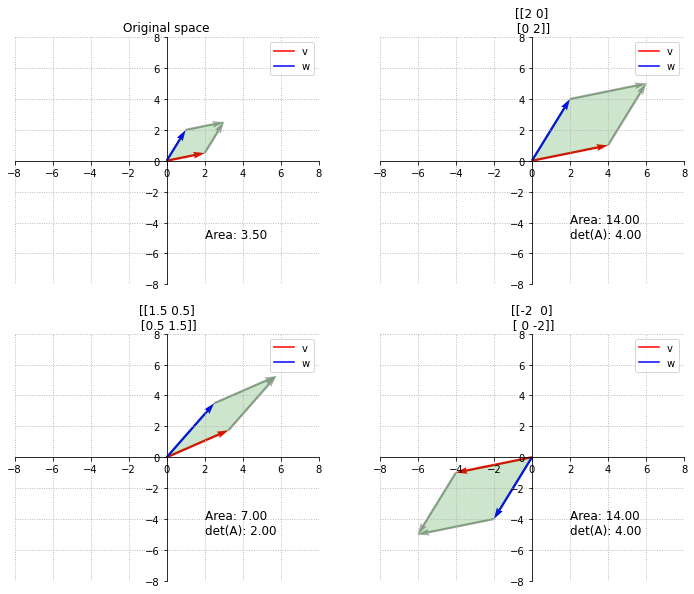

In [51]:
def draw_parallelogram(v, w, ax, color='g', alpha=0.2):
    # auxiliary function to draw a parallelogram between v and w
    from matplotlib.patches import Polygon
    x = [0, v[0], v[0]+w[0], w[0], 0]
    y = [0, v[1], v[1]+w[1], w[1], 0]
    ax.add_patch(Polygon(xy=list(zip(x, y)), fill=True, alpha=alpha, color=color))
    return ax

fig, axs = plt.subplots(2, 2, figsize=(12, 10))

As = [None, None, None]
As[0] = np.array([[2, 0], [0, 2]])
As[1] = np.array([[1.5, 0.5], [0.5, 1.5]])
As[2] = - As[0] 

v = np.array([2, 0.5])
w = np.array([1, 2])
o = np.array([0, 0])

axs[0,0].set_title('Original space')
plot_vectors([v, w, v, w], 
             origin=[o, o, w, v],
             color=['r', 'b', 'darkgray', 'darkgray'], 
             labels=['v', 'w'],
             xlim=(-8, 8),
             ylim=(-8, 8),
             ax=axs[0, 0])
draw_parallelogram(v, w, axs[0, 0])
area = np.linalg.det(np.vstack([v, w]))
axs[0,0].annotate('Area: {:.2f}'.format(area), xy=(2, -5), fontsize=12)

for i in range(3):
    ax = axs[(i+1)//2, (i+1)%2]
    A = As[i]
    ax.set_title(str(A))
    plot_vectors([A@v, A@w, A@v, A@w], 
                 origin=[o, o, A@w, A@v],
                 color=['r', 'b', 'darkgray', 'darkgray'], 
                 labels=['v', 'w'],
                 xlim=(-8, 8),
                 ylim=(-8, 8),
                 ax=ax)
    draw_parallelogram(A@v, A@w, ax)
    area = np.linalg.det(np.vstack([A@v, A@w]))
    ax.annotate('Area: {:.2f}\n'
                'det(A): {:.2f}'.format(area, np.linalg.det(A)), xy=(2, -5), fontsize=12)

The determinant of a $2 \times 2$ matrix is:

$$
\det(\bm{A}) = \det\left(\left[\begin{array}{cc}a & b\\c & d\end{array}\right]\right) = ad - bc
$$

Here are some points about $\det(\bm{A})$:
- The determinant is negative when $\bm{A}$ move vectors counter-clockwise
- The determinant is zero if and only if $\bm{A}$ is not full rank

Let $\bm{A},\bm{B} \in \mathbb{R}^{n \times n}$. The determinant satisfies these properties:

$$
\begin{align}
\det(\bm{A}) &= \det(\bm{A}^\top) \\
\det(c\bm{A}) &= c^n\det(\bm{A}) \\
\det(\bm{A}\bm{B}) &= \det(\bm{A}\bm{B}) \\
\det(\bm{A}) &= 0 \, \text{ if and only if } \bm{A} \text{ is full rank} \\
\det(\bm{A}^{-1}) &= \frac{1}{\det(\bm{A})} \, \text{ if } \bm{A} \text{ is full rank} \\
\end{align}
$$

In [52]:
print(np.linalg.det(np.eye(2)))
print(np.linalg.det(np.array([[0, 1], [1, 0]])))
print(np.linalg.det(np.array([[1, 1], [2, 2]])))
print(np.linalg.det(np.array([[2, 1], [2, 4]])))

1.0
-1.0
0.0
6.0


--- 
# Eigenvalues and Eigenvectors

Eigenvalues and eigvenvectors "simplify" a matrix $\bm{A}$ into scalars and vectors. I like to say that they are like "prime" numbers but for matrices.

Given a square matrix $\bm{A} \in \mathbb{R}^{n \times n}$, we say that $\lambda \in \mathbb{R}$ is an **eigenvalue** of $\bm{A}$, and $\bm{x}$ is its corresponding **eigenvector**, defined as:

$$
\bm{A}\bm{x} = \lambda \bm{x}, \quad \bm{x} \neq \bm{0}
$$

This definition means that the transforming $\bm{x}$ using $\bm{A}$ will return a vector that points in the same direction as $\bm{x}$, but that is scaled by $\lambda$. Let's use an animation to see this.

In [53]:
A = np.array([[2, 0.5], [0.5, 2]])
anim = animate_all_vectors(A, xmin=-3, xmax=3, ymin=-3, ymax=3, N=11, draw_eigens=True)
HTML(anim)

In [54]:
A = np.array([[0, 1], [-1, 0]])
anim1 = animate_all_vectors(A, xmin=-3, xmax=3, ymin=-3, ymax=3, N=11, draw_eigens=True)
    
A = np.array([[2, 2], [1, 1]])
anim2 = animate_all_vectors(A, xmin=-3, xmax=3, ymin=-3, ymax=3, N=11, draw_eigens=True)

s = '''
<div class="float-left">{}</div> 
<div class="float-left">{}</div>
'''.format(anim1, anim2)
HTML(s)

Note that for any eigenvector $\bm{x} \in \mathbb{R}^n$ and scalar $c \in \mathbb{R}$,

$$
\bm{A}(c\bm{x}) = c\bm{A}\bm{x} = c\lambda\bm{x} = \lambda(c\bm{x})
$$

Hence $c\bm{x}$ is also an eigenvector. To avoid this inconsistency, we usualy normalize the eigenvectors to have unit length (we would still have two eigvenvectors: $\bm{x}$ and $-\bm{x}$, but that is how mathematics work).

We can rewrite the equation above as follows:

$$
\begin{align}
\bm{A}\bm{x} &= \lambda \bm{x}, &\quad \bm{x} \neq \bm{0} \\
\lambda \bm{x} - \bm{A}\bm{x} &= \bm{0}, &\quad \bm{x} \neq \bm{0} \\
\lambda \bm{I} \bm{x} - \bm{A}\bm{x} &= \bm{0}, &\quad \bm{x} \neq \bm{0} \\
(\lambda \bm{I} - \bm{A})\bm{x} &= \bm{0}, &\quad \bm{x} \neq \bm{0}
\end{align}
$$

We know that $(\lambda \bm{I} - \bm{A})\bm{x} = \bm{0}$ has a non-zero solution to $\bm{x}$ if and only if $(\lambda \bm{I} - \bm{A})$ has a non-empty nullspace. Moreover, we know that this happens only when $(\lambda \bm{I} - \bm{A})$ is not full rank, which also means that 

$$\det(\lambda \bm{I} - \bm{A}) = 0$$

This is called the **characteristic equation** of $\bm{A}$. This equation is actually a polynomial equation of order $n$, so by the fundamental theorem of algebra we also know that we have $n$ possible real or complex-valued solutions.

Here are some properties of the eigenvalues and eigenvectors:

$$
\trace(\bm{A}) = \sum\limits_{i=1}^n \lambda_i \\
\det(\bm{A}) = \prod\limits_{i=1}^n \lambda_i
$$

Therefore, the trace can be seen as "half of the perimeter of the parallelogram", while the determinant is just its volume, i.e., "depth $\times$ width $\times$ height $\times \cdots$".

More:
- $\text{rank}(\bm{A}) = $ number of non-zero eigenvalues
- If $\bm{A}$ is full rank, then $\bm{A}^{-1}\bm{x}_i = (1/\lambda_i)\bm{x}_i$
- The eigenvalues of a diagonal or triangular matrix are just the diagonal entries
- If $\bm{A}$ is symmetric, then its eigenvalues are real and its eigenvectors are orthonormal (and vice-versa)

<br>
<center>
    <b>Questions:</b><br>
    (1) Why do the eigenvalues of a diagonal matrix lie along its diagonal? <br>
    (2) Why do the eigenvalues of a triangular matrix lie along its diagonal? <br>
    (3) Is is true that the eigenvalues of $\bm{A}\bm{B}$ are equal to the eigenvalues of $\bm{B}\bm{A}$? Why? <br>
    (4) Find the eigenvalues and eigenvectors of $\bm{A} = \left[\begin{array}{cc}0&1\\-1&0\end{array}\right]$. Check your answer using <i> np.linalg.eig</i> <br>
</center>

---

# Inverse Matrices

The inverse matrix is defined as:

$$
\begin{align}
\text{(left-inverse)} &\qquad \bm{A}^{-1}\bm{A} = \bm{I} \\
\text{(right-inverse)} &\qquad \bm{A}\bm{A}^{-1} = \bm{I} 
\end{align}
$$

That is, the inverse of $\bm{A}$ is a matrix that undoes $\bm{A}$. Here are a few notes about inverse matrices:

- The inverse matrix might not exist (we will see when)
- The inverse is only defined for square matrices $\bm{A} \in \mathbb{R}^{n\times n}$. For non-square matrices, we can compute their [pseudo-inverse](https://en.wikipedia.org/wiki/Moore%E2%80%93Penrose_inverse)
- If $\bm{A}$ is invertible, then $\bm{A}^{-1}\bm{b}$ is the only solution to $\bm{A}\bm{x} = \bm{b}$

In [55]:
A = np.array([[1, -2], [3, 2]])
b = np.array([1, 11])
print(np.linalg.inv(A))  # in numpy, we use np.linalg.inv for finding the inverse
print(np.linalg.inv(A).dot(b))

[[ 0.25   0.25 ]
 [-0.375  0.125]]
[3. 1.]


For example, if we want to go backwards from the transformed vector $\bm{b} = \bm{A}\bm{x}$ to the (unknown) solution vector $\bm{x}$, we can use the **inverse matrix** $\bm{A}^{-1}$. This is in fact how we solve a system of linear equations:

$$
\left[\begin{array}{cc}1 & -2 \\3 & 2\end{array}\right]\bm{x} =
\left[\begin{array}{c}1\\11\end{array}\right]
$$

$$
\begin{align}
\bm{x} &=
\left[\begin{array}{cc}1 & -2 \\3 & 2\end{array}\right]^{-1} \left[\begin{array}{c}1\\11\end{array}\right] \\
&= \left[\begin{array}{cc}1/4 & 1/4 \\-3/8 & 1/8\end{array}\right] \left[\begin{array}{c}1\\11\end{array}\right] \\
&= \left[\begin{array}{c}3 \\ 1\end{array}\right]
\end{align}
$$

In [56]:
# our previous example (try a different A for fun)
A = np.array([[1, -2], [3, 2]])
A_inv = np.linalg.inv(A)

v1 = np.array([1, -1.5])
v2 = np.array([-2, 1])
b = np.array([1, 11])
x = A_inv @ b

def plot_system_of_vectors(V, A, fixed_vector=None, color=None, labels=None):
    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    ax.set_title(str(A))
    camera = Camera(fig)
    n = 10
    for i in range(n + 1):
        alpha = i / n
        I = np.identity(A.shape[-1])
        Ai = I + alpha * (A - I)
        transf_vecs = Ai.dot(V).T.tolist()
        vecs = [fixed_vector, *transf_vecs] if fixed_vector is not None else transf_vecs
        _ = plot_vectors(vecs, 
                         color=list(color), 
                         labels=labels,
                         xlim=(-4, 4),
                         ylim=(-12, 12),
                         ax=ax)
        camera.snap()
    animation = camera.animate(blit=False, interval=100, repeat_delay=1000)
    plt.close()
    return animation.to_jshtml(default_mode='reflect')


anim1 = plot_system_of_vectors(np.vstack([v1, v2, x]).T, 
                               A, 
                               b,
                               color=['gray', 'r', 'b', 'g'],
                               labels=['b', 'v1', 'v2', 'x*'])

anim2 = plot_system_of_vectors(np.vstack([A @ v1, A @ v2, b]).T, 
                               A_inv, 
                               x,
                               color=['gray', 'r', 'b', 'g'],
                               labels=['x*', 'v1', 'v2', 'b'])


s = '''
<div class="float-left">{}</div> 
<div class="float-left">{}</div>
'''.format(anim1, anim2)
HTML(s)

The solution vector $\bm{x}$ is exactly the $\bm{b}$ vector transformed by $\bm{A}^{-1}$!

### Inverse of a $2 \times 2$ matrix

In general we use a numerical method to compute an inverse. But for a $2 \times 2$ matrix is easy to compute it by hand, as follows:

$$
\bm{A} = \left[\begin{array}{cc}a & b \\ c & d\end{array}\right], \quad
\bm{A}^{-1} = \frac{1}{\det(\bm{A})} \left[\begin{array}{cc}d & -b \\ -c & a\end{array}\right] = 
\frac{1}{ad - bc} \left[\begin{array}{cc}d & -b \\ -c & a\end{array}\right]
$$

### Inverse of a diagonal matrix

The inverse of a diagonal is simple:

$$
\bm{A} = \left[\begin{array}{ccc}A_{1,1} & & \\ & \ddots & \\ & & A_{n,n}\end{array}\right], \quad
\bm{A}^{-1} = \left[\begin{array}{ccc}1/A_{1,1} & & \\ & \ddots & \\ & & 1/A_{n,n}\end{array}\right]
$$



### Properties of the inverse

Here are some properties of the inverse, assuming that $\bm{A},\bm{B},\bm{C} \in \mathbb{R}^{n \times n}$ are invertible:

$$
\begin{align}
(\bm{A}^{-1})^{-1} &= \bm{A} \\
(c\bm{A})^{-1} &= c^{-1}\bm{A}^{-1} \\
(\bm{A}\bm{B})^{-1} &= \bm{B}^{-1}\bm{A}^{-1} \\
(\bm{A}\bm{B}\bm{C})^{-1} &= \bm{C}^{-1}\bm{B}^{-1}\bm{A}^{-1} \\
(\bm{A}^{-1})^\top &= (\bm{A}^\top)^{-1} = \bm{A}^{-\top}
\end{align}
$$


### When $\bm{A}^{-1}$ does exist?

- When the columns of $\bm{A}$ are linearly independent
- When $\text{range}(\bm{A}) = \mathbb{R}^n$
- When $\text{nullspace}(\bm{A}) = \bm{0}$
- When $\bm{A}$ is full rank
- When there is no $\bm{x} \neq \bm{0}$ such that $\bm{A}\bm{x} = \bm{0}$
- When $\det(\bm{A}) \neq 0$
- When all eigenvalues are not zero
- When $\bm{A}$ is diagonal and none of its diagonal entries are zero
- When $\bm{A}$ is triangular and none of its diagonal entries are zero

You can find more conditions for invertibility here: https://en.wikipedia.org/wiki/Invertible_matrix#The_invertible_matrix_theorem

---
# Quadractic form

Given a square matrix $\bm{A} \in \mathbb{R}^{n \times n}$ and a vector $\bm{x} \in \mathbb{R}^n$, a **quadratic form** is defined explicitily as:

$$
\bm{x}^\top \bm{A} \bm{x} = \sum\limits_{i=1}^n \sum\limits_{j=1}^n A_{i,j} x_i x_j
$$

For example, for $\bm{A} = \left[\begin{array}{cc}2 & 1 \\ 1 & 3\end{array}\right]$, and $\bm{x} = [x, y]$:

$$
\bm{x}^\top \bm{A} \bm{x} = 2 x^2 + 1xy + 1yx + 3y^2 = 2x^2 + 2xy + 3y^2
$$

Therefore the matrix $\bm{A}$ gives the coefficients of a quadractic formula. Also, note that:

$$
\bm{x}^\top \bm{A} \bm{x} = (\bm{x}^\top \bm{A} \bm{x})^\top = \bm{x}^\top \bm{A} \bm{x} = \bm{x}^\top (\frac{1}{2}\bm{A} + \frac{1}{2}\bm{A}^\top) \bm{x}
$$

So, we usually assume that $\bm{A} \in \mathbb{S}^n$ is a symmetric matrix. 

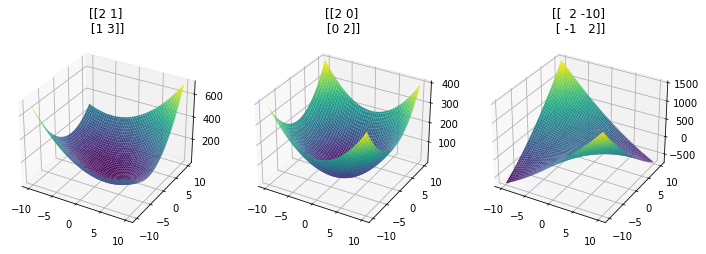

In [57]:
def plot_quadractic_form_3d(A, ax):
    n_points = 100
    points = np.linspace(-10, 10, n_points)
    x, y = np.meshgrid(points, points)
    X = np.vstack([x.flatten(), y.flatten()])
    f_x = np.dot(np.dot(X.T, A), X)
    f_x = np.diag(f_x).reshape(n_points, n_points)
    ax.plot_surface(x, y, f_x, cmap='viridis')

fig = plt.figure(figsize=(12, 4))

ax = fig.add_subplot(1, 3, 1, projection='3d')
A = np.array([[2, 1], [1, 3]])
ax.set_title(str(A))
plot_quadractic_form_3d(A, ax)

ax = fig.add_subplot(1, 3, 2, projection='3d')
A = np.array([[2, 0], [0, 2]])
ax.set_title(str(A))
plot_quadractic_form_3d(A, ax)

ax = fig.add_subplot(1, 3, 3, projection='3d')
A = np.array([[2, -10], [-1, 2]])
ax.set_title(str(A))
plot_quadractic_form_3d(A, ax)

---

# Positive Definite Matrices

### Positive Definite (PD)

A symmetric matrix $\bm{A} \in \mathbb{S}^n$ is **positive definite** if and only if, for any $\bm{x} \in \mathbb{R}^n$ (except $\bm{x} = \bm{0}$), 

$$
\bm{x}^\top\bm{A}\bm{x} > 0
$$

This is usually denoted $A \succ 0$. 

### Positive Semi-Definite (PSD)

A symmetric matrix $\bm{A} \in \mathbb{S}^n$ is **positive semi-definite** if and only if, for any $\bm{x} \in \mathbb{R}^n$, 

$$
\bm{x}^\top\bm{A}\bm{x} \geq 0
$$

This is usually denoted $A \succeq 0$. 

### Negative Definite (ND) and Negative Semi-Definite (NSD)

Analogously, a symmetric matrix $\bm{A} \in \mathbb{S}^n$ is **negative definite** ($A \prec 0$) when $\bm{x}^\top\bm{A}\bm{x} < 0$. And it is **negative semi-definite** ($A \preceq 0$) when $\bm{x}^\top\bm{A}\bm{x} \leq 0$.

### Indefinite

A symmetric matrix $\bm{A} \in \mathbb{S}^n$ is indefinite when it is neither PSD nor NSD: there exists $\bm{x}_1, \bm{x}_2 \in \mathbb{R}^n$ such that $\bm{x}_1^\top\bm{A}\bm{x}_1 < 0$ and $\bm{x}_2^\top\bm{A}\bm{x}_2 > 0$.


### Properties 

- If $\bm{A}$ is PSD, then $-\bm{A}$ is NSD (and vice-versa)
- If $\bm{A}$ is indefinite, then $-\bm{A}$ is as well.
- If $\bm{A}$ is PD or ND, then $\bm{A}^{-1}$ exists.
- If $\bm{A}$ is PD, then its eigenvalues are positive (analogously for ND).
- If $\bm{A}$ is diagonal and all of its elements are positive, then it is PD.
- If $\bm{A}$ is PSD, then its eigenvalues are positive or zero (analogously for NSD).

Finally, given any matrix $\bm{A} \in \mathbb{R}^{m \times n}$ (not necessarily symmetric), the Gram matrix $\bm{G} = \bm{A}^\top\bm{A}$ is always symmetric and PSD. Furthermore, if $m \geq n$ and $\bm{A}$ is full rank, then $\bm{G}$ is PD.

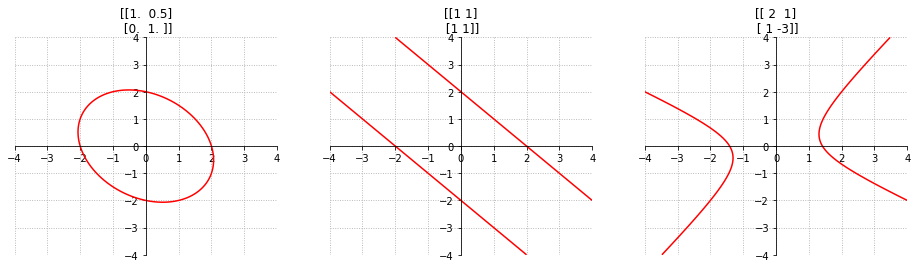

In [58]:
def plot_quadractic_form_2d(ax, A):
    n_points = 100
    points = np.linspace(-4, 4, n_points)
    x, y = np.meshgrid(points, points)

    X = np.vstack([x.flatten(), y.flatten()])
    f_xy = np.dot(np.dot(X.T, A), X)
    f_xy = np.diag(f_xy).reshape(n_points, n_points)
    g_xy = 4
    
    ax.set_title(str(A))
    ax.contour(x, y, (f_xy - g_xy), [0], colors='r')
    stylize_plot(ax, xlim=(-4, 4), ylim=(-4, 4))

fig, axs = plt.subplots(1, 3, figsize=(16, 4))

# PD
A = np.array([[1, 0.5], [0, 1]])  
plot_quadractic_form_2d(axs[0], A)

# PSD (try to add 0.1*I to A)
A = np.array([[1, 1], [1, 1]])  # + 0.1 * np.eye(2)
plot_quadractic_form_2d(axs[1], A)

# indefinite
A = np.array([[2, 1], [1, -3]])  
plot_quadractic_form_2d(axs[2], A)

<center>
    <b>Exercise:</b><br>
    • Draw the eigenvectors scaled by their eigenvalues for the plots  above. <br>
</center>

--- 
# Orthogonal Matrices

We saw that two vectors $\bm{v}$ and $\bm{w}$ are **orthogonal** iff $\bm{v}\cdot\bm{w} = 0$. When $\bm{v}$ has length $\|\bm{v}\| =1$ we say that it is **normalized**. When two vectors are both orthogonal and normalized to have unit length then we call them **orthonormal**.

Analogously, a square matrix $\bm{U} \in \mathbb{R}^{n \times n}$ is **orthogonal** if all of its columns are **orthonormal**. If $\bm{U}$ has complex entries we usually use the term unitary instead. Let $\bm{u}_i$ represent the $i$-th column of $\bm{U}$, then:

$$
\bm{u}_i \cdot \bm{u}_j = \begin{cases}
1, \text{ if } i = j \\
0, \text{otherwise}
\end{cases}
$$

In matrix form, we say that

$$
\bm{U}^\top \bm{U} = \bm{I} = \bm{U}\bm{U}^\top
$$

This also means that the inverse of an orthogonal matrix is its transpose:

$$
\bm{U}^{-1} = \bm{U}^\top
$$

An example of an orthogonal matrix is a rotation matrix:

$$
\bm{R}(\theta) = \left[\begin{array}{cc}
\cos(\theta) & -\sin(\theta) \\
\sin(\theta) & \cos(\theta)
\end{array}\right]
$$

### Length and Angle Preservation

A nice property of orthogonal matrices is that they preserve the length and the angle of vectors. That is, for any nonzero vector $\bm{x} \in \mathbb{R}^n$:

$$
\|\bm{U}\bm{x}\|_2 = \|\bm{x}\|_2
$$

Similarly, the angle between two vectors is preserved after they a orthogonal transmation:

$$
\cos(\theta(\bm{U}\bm{x}, \bm{U}\bm{y})) = \frac{(\bm{U}\bm{x})^\top(\bm{U}\bm{y})}{\|\bm{U}\bm{x}\|\|\bm{U}\bm{y}\|}
= \frac{\bm{x}^\top\bm{U}^\top\bm{U}\bm{y}}{\|\bm{x}\|\|\bm{y}\|}
= \frac{\bm{x}^\top\bm{y}}{\|\bm{x}\|\|\bm{y}\|} 
= \cos(\theta(\bm{x}, \bm{y}))
$$

Let's see some examples of transformations produced by orthogonal matrices:

In [59]:
# rotation matrix
theta = np.pi / 4
U = np.array([[np.cos(theta), -np.sin(theta)], 
              [np.sin(theta), np.cos(theta)]])
anim1 = animate_all_vectors(U, xmin=-3, xmax=3, ymin=-3, ymax=3, N=11)
    
# reflection matrix
U = np.array([[-1, 0], 
              [0, 1]])
anim2 = animate_all_vectors(U, xmin=-3, xmax=3, ymin=-3, ymax=3, N=11)

s = '''
<div class="float-left">{}</div> 
<div class="float-left">{}</div>
'''.format(anim1, anim2)
HTML(s)

**Exercise:** Try to animate the inverse of $\bm{U}$ above.

---
# Eigenvalue Value Decomposition (EVD)

Remember the equation that defines an eigenvalue $\lambda$ and an eigenvector $\bm{x}$ for a square matrix $\bm{A} \in \mathbb{R}^{n \times n}$:

$$
\bm{A}\bm{x} = \lambda\bm{x}
$$


### Diagonalization

Turns out we can write this equation for all eigenvalues and eigenvectors simultaneously in matrix form. The idea is to convert the matrix $\bm{A}$ into a diagonal matrix $\bm{\Lambda}$ by using eigenvectors and eigenvalues in the right way:

$$
\bm{A}\bm{X} = \bm{X}\bm{\Lambda}
$$

where the columns of $\bm{X} \in \mathbb{R}^{n \times n}$ are the eigenvectors of $\bm{A}$ and $\Lambda$ is a diagonal matrix whose entries are the eigenvalues of $\bm{A}$:

$$
\bm{X} = \left[\begin{array}{cccc}
| & | &  & | \\
\bm{x}_1 & \bm{x}_2 & \cdots & \bm{x}_n \\
| & | &  & |
\end{array}\right],
\qquad
\bm{\Lambda} = \left[\begin{array}{cccc}
\lambda_1 &  & & \\
 &  & \ddots & \\
 &  &  & \lambda_n
\end{array}\right]
$$

Moreover, if $\bm{X}$ is full rank, i.e., the eigenvectors are linearly independent, then $\bm{X}^{-1}$ exists, and we can rewrite the equation as:

$$
\bm{A} = \bm{X}\bm{\Lambda}\bm{X}^{-1}
$$

If we can write a matrix $\bm{A}$ in this form, we say that $\bm{A}$ is **diagonalizable**. In other words, we factorized the matrix $\bm{A}$ into a product of three matrices.



In [60]:
A = np.array([[2, 0.5], [0.5, 2]])
lbda, X = np.linalg.eig(A)
Lbda = np.diag(lbda)
A_diag = X @ Lbda @ np.linalg.inv(X)
A_diag

array([[2. , 0.5],
       [0.5, 2. ]])

### Properties of EVD

- If the eigenvalues are all different, then $\bm{X}$ has linear independent columns, and thus it is invertible.

- We can normalize the eigenvectors to have unit norm: $\bm{A}(c\bm{x}) = \lambda(c\bm{x})$, with $c = 1/\|\bm{x}\|$.


### Application: powers of $\bm{A}$

A cool application of EVD is to find the power of matrices. For example, let $\bm{A} = \left[\begin{array}{cc}2 & 0.5 \\ 
1 & 3\end{array}\right]$. Suppose we want to find $\bm{A}^{100}$:

$$
\bm{A}^2 = \left[\begin{array}{cc}2 & 1 \\ 1 & 3\end{array}\right] \cdot 
\left[\begin{array}{cc}2 & 0.5 \\ 1 & 3\end{array}\right] 
= 
\left[\begin{array}{cc}
4.5 & 2.5 \\ 
5 & 9.5
\end{array}\right] \\
\bm{A}^3 = \left[\begin{array}{cc}2 & 1 \\ 1 & 3\end{array}\right] \cdot 
\left[\begin{array}{cc}2 & 0.5 \\ 1 & 3\end{array}\right] \cdot 
\left[\begin{array}{cc}2 & 0.5 \\ 1 & 3\end{array}\right] 
= 
\left[\begin{array}{cc}
11.5 & 9.75 \\ 
19.5 & 31
\end{array}\right] \\
A^{100} = \text{100 matrix multiplications} = \text{too expensive}
$$

If we diagonalize $\bm{A}$, we find that

$$
\bm{A}^2 = \bm{X}\bm{\Lambda}\bm{X}^{-1} \cdot \bm{X}\bm{\Lambda}\bm{X}^{-1} = \bm{X}\bm{\Lambda}^2\bm{X}^{-1}
$$

And in general:

$$
\bm{A}^k = \bm{X}\bm{\Lambda}^k\bm{X}^{-1}
$$

Since $\Lambda$ is a diagonal matrix, its power is simply to compute: $\bm{\Lambda}^k = \text{diag}(\lambda_1^k, ..., \lambda_n^k)$. With this we ended up with only 3 matrix multiplications.

In [61]:
%%time
A = np.array([[1, 0.2], [1, 1]])
A_naive = np.eye(2)
for _ in range(1000):
    A_naive = A_naive @ A
A_naive

CPU times: user 3.48 ms, sys: 224 µs, total: 3.7 ms
Wall time: 2.64 ms


array([[1.70452647e+160, 7.62287412e+159],
       [3.81143706e+160, 1.70452647e+160]])

In [62]:
%%time
A = np.array([[1, 0.2], [1, 1]])
lbda, X = np.linalg.eig(A)
Lbda = np.diag(lbda)
A_evd = X @ Lbda ** 1000 @ np.linalg.inv(X)
A_evd

CPU times: user 332 µs, sys: 69 µs, total: 401 µs
Wall time: 10.8 ms


array([[1.70452647e+160, 7.62287412e+159],
       [3.81143706e+160, 1.70452647e+160]])

### Application: Fibonacci numbers

The Fibonacci sequence $0,1,1,2,3,5,8,13,...$ is given by:

$$
F_{k+2} = F_{k+1} + F_{k}
$$

Our goal is to compute $F_{100}$. To do that, we will use linear algebra and EVD, as follows. Let $\bm{u}_k$ be

$$
\bm{u}_k = \left[\begin{array}{c}F_{k+1}\\F_k\end{array}\right]
$$

The rule 

$$
\begin{cases}
F_{k+2} = F_{k+1} + F_{k} \\
F_{k+1} = F_{k_+1}
\end{cases}
$$

can be framed as:

$$
\begin{align}
\bm{u}_{k+1} &= \left[\begin{array}{cc}1 & 1\\1 & 0\end{array}\right]\bm{u}_k \\
             &= \left[\begin{array}{c}F_{k+1} + F_k \\ F_{k+1}\end{array}\right] \\
             &= \left[\begin{array}{c}F_{k+2} \\ F_{k+1}\end{array}\right]
\end{align}
$$

So, at every step we multiply by $\bm{A} = \left[\begin{array}{cc}1 & 1\\1 & 0\end{array}\right]$. If we want to compute $F_{100}$, we ended computing $\bm{A}^{100}$: 

$$
\bm{u}_{100} = \bm{A}^{100}\bm{u}_0
$$

So all we have to do is apply EVD to $\bm{A}$ and compute $A^{100}$ as before:

In [63]:
A = np.array([[1, 1], [1, 0]])
lbda, X = np.linalg.eig(A)
Lbda = np.diag(lbda)
A_100 = X @ Lbda ** 100 @ np.linalg.inv(X)
u_0 = np.array([1, 0])
u_100 = A_100 @ u_0
F_100 = u_100[1]
# some mismatch due to numeric precision
print(int(F_100))
print(354224848179261915075)

354224848179263045632
354224848179261915075


---
# Singular Value Decomposition (SVD)

SVD generalized EVD to **any matrix** $\bm{A} \in \mathbb{R}^{m \times n}$.

The idea is that we can find *orthonormal* vectors $\bm{u} \in \mathbb{R}^m$ and $\bm{v} \in \mathbb{R}^n$, and a scalar $\sigma$ such that:

$$
\bm{A}\bm{v} = \sigma\bm{u}
$$

So, $\bm{A}$ is diagonalized by $\bm{u}$ and $\bm{v}$. In matrix form we have:

$$
\bm{A} = \bm{U}\bm{\Sigma}\bm{V}^\top = \sigma_1 \bm{u}_1 \bm{v}_1^\top + \cdots + \sigma_r \bm{u}_r \bm{v}_r^\top
$$

In other words, the matrix $\bm{A}$ is the sum of $r$ rank-1 matrices $\bm{u}_i \bm{v}_i^\top \in \mathbb{R}^{m \times n}$ scaled by the coefficients $\sigma_i \in \mathbb{R}$. More specifically:

$$
\bm{A} = \bm{U}\bm{\Sigma}\bm{V}^\top =
\left[\begin{array}{ccc}
| & | & | \\
\bm{u}_1 & \cdots & \bm{u}_r  \\
| & | & | \\
\end{array}\right]
\left[\begin{array}{cccc}
\sigma_1 &  & & \\
 & \sigma_2 & &  \\
 &  & \ddots & \\
 &  &  & \sigma_r \\
\end{array}\right]
\left[\begin{array}{ccc}
 - & \bm{v}_1^\top & - \\
 - & \vdots & - \\
 - & \bm{v}_r^\top & - \\
\end{array}\right]
$$

where, 
- $\bm{U} \in \mathbb{R}^{m \times r}$ is a matrix with orthonormal columns ($\bm{U}^\top\bm{U} = \bm{I}$) called **left singular vectors**.
- $\bm{V} \in \mathbb{R}^{r \times n}$ is a matrix with orthonormal rows and columns ($\bm{V}\bm{V}^\top = \bm{V}^\top\bm{V} = \bm{I}$) called **right singular vectors**.
- $\bm{\Sigma} \in \mathbb{R}^{r \times r}$ is a matrix containing $r = \min(m,n)$ positive **singular values** on the main diagonal.
- $r = \text{rank}(\bm{A})$ is the number of nonzero singular values.

### How do we find $\bm{U}, \bm{\Sigma}, \bm{V}$?

The trivial way is:
- $\bm{U} = $ unit-norm eigenvectors of $\bm{A}\bm{A}^\top$
- $\bm{V} = $ unit-norm eigenvectors of $\bm{A}^\top\bm{A}$
- $\bm{\Sigma} = $ square root of the eigenvalues of $\bm{A}^\top\bm{A}$ or $\bm{A}\bm{A}^\top$ (they are the same).

### Geometric Interpretation

In [64]:
def plot_system_of_vectors(V, A, color=None, labels=None, title=None):
    fig, ax = plt.subplots(1, 1, figsize=(6, 4))
    ax.set_title(str(A) if title is None else title)
    camera = Camera(fig)
    n = 10
    for i in range(n + 1):
        alpha = i / n
        I = np.identity(A.shape[-1])
        Ai = I + alpha * (A - I)
        transf_vecs = Ai.dot(V).T.tolist()
        _ = plot_vectors(transf_vecs, 
                         color=list(color), 
                         labels=labels,
                         xlim=(-3, 3),
                         ylim=(-3, 3),
                         ax=ax)
        camera.snap()
    animation = camera.animate(blit=False, interval=100, repeat_delay=1000)
    plt.close()
    return animation.to_jshtml(default_mode='once')


A = np.array([[1, 1], [0, 0.5]])
v1 = np.array([2, 0])
v2 = np.array([0, 2])

# svd returns U, sigma as an array, and V transposed
U, sigma, V_T = np.linalg.svd(A)
# transform array to diagonal matrix
Sigma = np.diag(sigma)

# plot animations
anim1 = plot_system_of_vectors(np.vstack([v1, v2]).T, 
                               A, title='A', 
                               color=['r', 'b'], labels=['v1', 'v2'])

anim2 = plot_system_of_vectors(np.vstack([v1, v2]).T, 
                               V_T, title='V_T',
                               color=['r', 'b'], labels=['v1', 'v2']
)

anim3 = plot_system_of_vectors(np.vstack([V_T @ v1, V_T @ v2]).T, 
                               Sigma, title='Sigma @ V_T',
                               color=['r', 'b'], labels=['v1', 'v2']
)

anim4 = plot_system_of_vectors(np.vstack([Sigma @ V_T @ v1, Sigma @ V_T @ v2]).T, 
                               U, title='U @ Sigma @ V_T',
                               color=['r', 'b'], labels=['v1', 'v2']
)

s = '''
<div class="float-left">{}</div> 
<div class="float-left">{}</div>
<div class="clear"></div>
<div class="float-left">{}</div> 
<div class="float-left">{}</div>
'''.format(anim1, anim2, anim3, anim4)
HTML(s)

### Application: Image Compression

Here we will see that although images mostly have full rank, they have a **low effective rank**. This means that many of its singular values are small and can be ignored. This is important for communication settings.

Concretely, let $\bm{A} = \bm{U}\bm{\Sigma}\bm{V}^\top$ be the SVD factorization of $\bm{A}$. We define the **truncated SVD** of $\bm{A}$ as:

$$
\hat{\bm{A}}_K = \bm{U}_K\bm{\Sigma}_K\bm{V}_K^\top
$$

Where we use the first $K$ columns of $\bm{U}$, the first $K$ singular values of $\bm{\Sigma}$, and the first $K$ rows of $\bm{V}$ in the original SVD formulation. It is known that this formulation is the optimal approximation for a rank $K$ matrix, in the sense that it minimizes the error: 

$$
\|\bm{A} - \hat{\bm{A}}_K\| = \sum_{i=K+1}^r \sigma_i
$$

The total number of parameters needed to represent an $m \times n$ matrix using a rank $k$ approximation is $mk + nk + k = k(m+n+1)$, a gain of $r/k$. For example:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


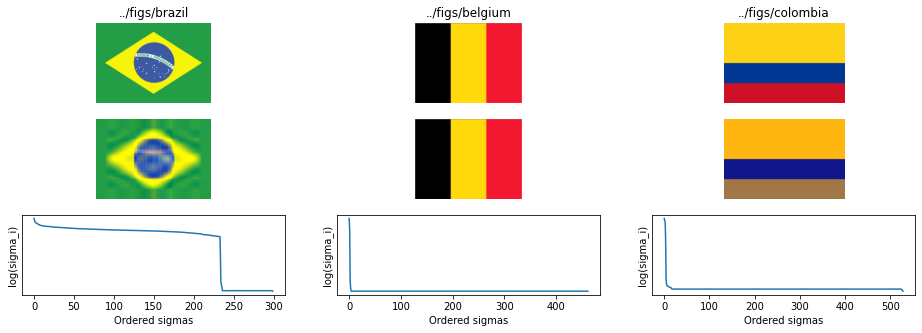

In [65]:
import matplotlib.image as mpimg
fig, axs = plt.subplots(3, 3, figsize=(16, 5))

def truncated_svd(img, k=None):
    if k is None:
        k = min(img.shape[0], img.shape[1])
    # img.shape is (height, width, channels)
    # so we are concatenating channels with width
    img_flat = img.reshape(img.shape[0], -1)
    # img_flat = img.transpose((1, 0, 2)).reshape(img.shape[1], -1)
    # svd returns U, sigma as an array, and V transposed
    U, sigma, V_T = np.linalg.svd(img_flat)
    # diagonal matrix
    Sigma = np.diag(sigma)
    # truncated svd
    reconst_img = U[:, :k] @ Sigma[:k, :k] @ V_T[:k, :]
    # get channels dimension back
    reconst_img = reconst_img.reshape(img.shape)
    #reconst_img = reconst_img.reshape(img.shape[1], img.shape[0], img.shape[2]).transpose((1, 0, 2))
    return reconst_img, sigma

flags = {
    '../figs/brazil_flag.png': 5, # k=5 components
    '../figs/belgium_flag.png': 1,
    '../figs/colombia_flag.png': 2,
}
use_gray_scale = False  # try setting to True to see what happens

# function to convert a RGB image to gray scale
rgb2gray = lambda img : np.dot(img[... , :3] , [0.2989, 0.5870, 0.1140])
img_show_kwargs = dict(cmap='gray', vmin=0, vmax=1) if use_gray_scale else {}

for i, (fname, n_components) in enumerate(flags.items()):
    img = mpimg.imread(fname)
    img = rgb2gray(img)[..., None] if use_gray_scale else img
    img_reconst, sigma = truncated_svd(img, k=n_components)
    
    axs[0,i].set_title(fname.split('_')[0].capitalize())
    axs[0,i].imshow(img, **img_show_kwargs)
    axs[0,i].axis('off')
    
    axs[1,i].imshow(img_reconst, **img_show_kwargs)
    axs[1,i].axis('off')
    
    axs[2,i].plot(np.log(sigma), '-')
    axs[2,i].set_xlabel('Ordered sigmas')
    axs[2,i].set_ylabel('log(sigma_i)')
    axs[2,i].set_yticks([])


### Application: Principal Component Analysis (PCA) via SVD

Data often comes in a table format: $n$ samples and $p$ features per sample. For example, let's create a simple 2d dataset and find the two most important components using SVD:

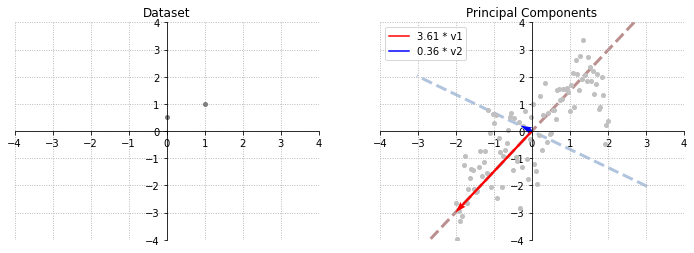

In [66]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
stylize_plot(axs[0], xlim=(-4, 4), ylim=(-4, 4))
stylize_plot(axs[1], xlim=(-4, 4), ylim=(-4, 4))

n = 100
x = np.linspace(-2, 2, n)
y = np.sin(x**2) + x + np.random.randn(n)
X = np.vstack([x, y]).T
axs[0].plot(A[:, 0], A[:, 1], '.', color='gray', markersize=8)
axs[0].set_title('Dataset')


# center mean
A = (X - X.mean(axis=0)[None, :])
axs[1].plot(A[:, 0], A[:, 1], '.', color='silver', markersize=8)
axs[1].set_title('Principal Components')

# sample covariance matrix
S = A.T @ A / (n - 1)

U, sigma, V_T = np.linalg.svd(S)
v_1 = sigma[0] * V_T[0]
v_2 = sigma[1] * V_T[1]
plot_vectors([v_1, v_2], 
             color=['r', 'b'], 
             labels=['{:.2f} * v1'.format(sigma[0]), 
                     '{:.2f} * v2'.format(sigma[1])], 
             ax=axs[1], 
             xlim=(-4, 4), 
             ylim=(-4, 4),
             zorder=2)

pts = np.linspace(-10, 10, 3)
axs[1].plot(v_1[0] * pts, v_1[1] * pts, ls='--', color='rosybrown', linewidth=3, zorder=0)
axs[1].plot(v_2[0] * pts, v_2[1] * pts, ls='--', color='lightsteelblue', linewidth=3, zorder=0)

---
# Least Squares Estimation

Now we will look at a famous application of Linear Algebra: Linear Regression.


### Galton Dataset

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/b/be/Karl_Pearson%3B_Sir_Francis_Galton.jpg/1280px-Karl_Pearson%3B_Sir_Francis_Galton.jpg" width="50%" />
<center>Francis Galton (right), aged 87, on the stoep at Fox Holm, Cobham, with the statistician Karl Pearson. <a href="https://en.wikipedia.org/wiki/Francis_Galton#/media/File:Karl_Pearson;_Sir_Francis_Galton.jpg">[Source].</a> </center>

We will use the famous Galton Dataset (available [here](https://dataverse.harvard.edu/dataset.xhtml?persistentId=doi:10.7910/DVN/T0HSJ1)). This dataset was created in 1886 by Francis Galton to study the relationship between heights of parents and their adult children. It revolutionalized the science of statistics at the time, coining the term **correlation** for the first time. In his study, Galton observed that

> A man’s son tends to be roughly as tall as his father but the son’s height tends to be closer (regress or drift towards) to the overall average heights.

The dataset contains 898 samples, each consisting of the following 8 features:

- family: An identifier for the family to which the child belongs.
- father: The height of the father in inches.
- mother: The height of the mother in inches.
- gender: The gender of the child.
- height: The height of the child in inches.
- kids: The number of the children (Galton numbered the children in desending order of height, with male children listed before female children).
- male: 1 if the child is male, 0 otherwhise.
- female: 1 if the child is female, 0 otherwhise.

We can see that there are several distinct types of columns: some features represent qualities (e.g., `gender`) and others quantities (e.g., `height`). Here, we are interested in the relation between the columns `father` and `height`.

First, let's load the dataset and do some data exploration:

In [70]:
import pandas as pd

# read data
df = pd.read_csv('../data/galton-data.tab', sep='\t')

# convert inches to cm (1 in = 2.54 cm)
df[['father', 'mother', 'height']] = df[['father', 'mother', 'height']] * 2.54
df

,family,father,mother,gender,height,kids,male,female
0,1,199.39,170.18,M,185.928,4,1.0,0.0
1,1,199.39,170.18,F,175.768,4,0.0,1.0
2,1,199.39,170.18,F,175.260,4,0.0,1.0
3,1,199.39,170.18,F,175.260,4,0.0,1.0
4,2,191.77,168.91,M,186.690,4,1.0,0.0
...,...,...,...,...,...,...,...,...
893,136A,173.99,165.10,M,173.990,8,1.0,0.0
894,136A,173.99,165.10,M,171.958,8,1.0,0.0
895,136A,173.99,165.10,F,162.560,8,0.0,1.0
896,136A,173.99,165.10,F,161.290,8,0.0,1.0


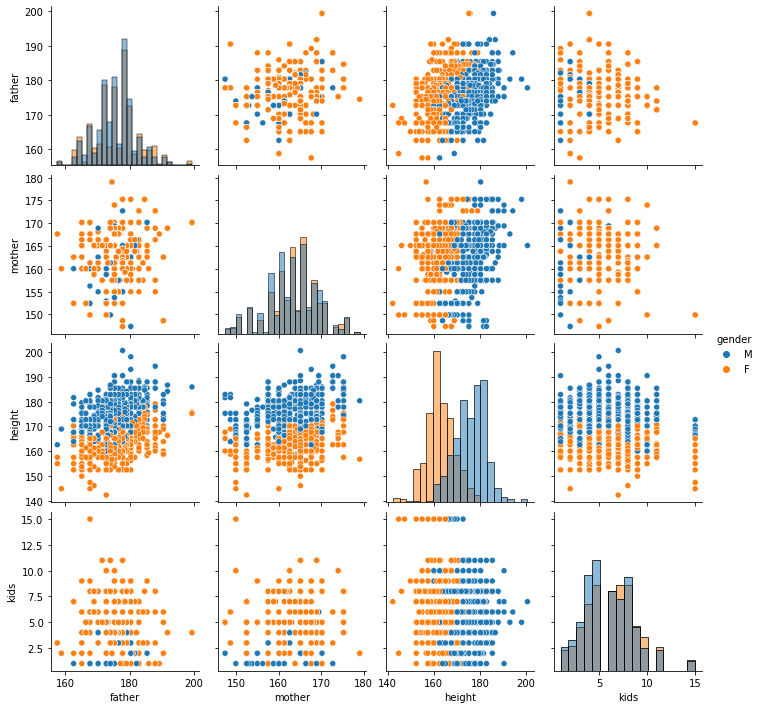

In [79]:
import seaborn as sns
sns.pairplot(df, vars=df.columns[[1,2,4,5]], hue='gender', diag_kind='hist')

<AxesSubplot:ylabel='gender'>

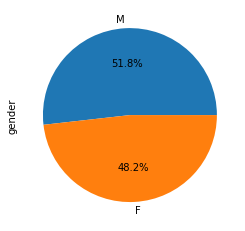

In [72]:
df['gender'].value_counts().plot(kind='pie', autopct='%1.1f%%')

In [73]:
# get height of fathers and their sons (male child)
df_male = df[df['gender'] == 'M']
df_father_son = df_male[['father', 'height']]
df_father_son.describe()

,father,height
count,465.000000,465.000000
mean,175.687157,175.841196
std,5.841820,6.684249
min,157.480000,152.400000
25%,172.720000,171.450000
50%,175.260000,175.768000
75%,179.070000,180.340000
max,199.390000,200.660000


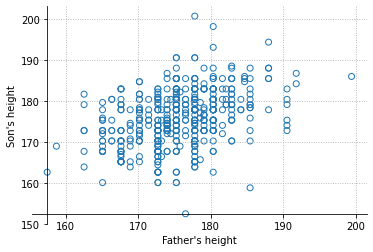

In [74]:
# convert to numpy as plot
data = df_father_son.to_numpy()
x = data[:, 0]  # father height
y = data[:, 1]  # son height

fig, ax = plt.subplots(figsize=(6, 4))
stylize_plot(ax, xlim=None, ylim=None)
ax.spines['left'].set_position(('data', x.min()))
ax.spines['bottom'].set_position(('data', y.min()))

ax.set_xlabel("Father's height")
ax.set_ylabel("Son's height")
ax.scatter(x, y, s=36, edgecolor='tab:blue', facecolor='None')

### Ordinary Least Squares

If $m > n$, meaning that we have more samples than features, then we have an overdetermined solution. This implies that we do not have an "exact solution", but we can find an approximate solution that satisfies $\bm{A}\bm{x} = \bm{b}$ as good as possible. We can do this by minimizing the the **least squares objective**:

$$
\begin{align}
f(\bm{x}) &= \frac{1}{2} \|\bm{A}\bm{x} - \bm{b}\|^2_2 \\
&= \frac{1}{2}(\bm{A}\bm{x} - \bm{b})^\top(\bm{A}\bm{x} - \bm{b})  \\
&= \frac{1}{2}\big[ - \bm{b}^\top\bm{A}\bm{x} + \bm{b}^\top\bm{b} + \bm{x}^\top\bm{A}^\top\bm{A}\bm{x} -  \bm{x}^\top\bm{A}^\top\bm{b} \big] \\
&=  \frac{1}{2}\bm{x}^\top\bm{A}^\top\bm{A}\bm{x} - \bm{x}^\top\bm{A}^\top\bm{b} + \frac{1}{2}\bm{b}^\top\bm{b}
\end{align}
$$

We know from matrix calculus (which we will recap later) that a minimum of $f(\bm{x})$ occurs when the $\frac{\partial }{\partial \bm{x}}f(\bm{x}) = \bm{0}$. So, if we take the derivative of $f(\bm{x})$ and set it to zero, we find that:

$$
\frac{\partial}{\partial \bm{x}}f(\bm{x}) = \bm{A}^\top\bm{A}\bm{x} - \bm{A}^\top\bm{b}
$$

Setting to zero:

$$
\bm{A}^\top\bm{A}\bm{x} = \bm{A}^\top\bm{b}
$$

The (Gram) matrix $\bm{A}^\top\bm{A}$ is symmetric and positive semi-definite (its eigenvalues are non-negative). The solution $\hat{\bm{x}}$ below is known as the **ordinary least squares (OLS) solution**:

$$
\hat{\bm{x}} = (\bm{A}^\top\bm{A})^{-1}\bm{A}^\top\bm{b}
$$

The quantity $A^\dagger = (\bm{A}^\top\bm{A})^{-1}\bm{A}^\top$ is known as the left pseudo inverse of a non-square matrix $\bm{A}$, and it is very useful since it approximates the (left) inverse of $\bm{A}$ (in numpy you can use `np.linalg.pinv` to invoke the pseudo inverse). It can be shown that the OLS solution has a unique global minimum, since the overall problem is convex.


### Regularized Least Squares (Ridge Regression)

We know that the matrix $\bm{G} = \bm{A}^\top\bm{A}$ might not be invertible. Moreover, we also saw that the most important entries of a matrix lies on its diagonal (a diagonally dominant matrix is invertible). Therefore, we can add small values on the diagonal of $\bm{G}$ so it becomes invertible. The is commonly known as **Tikhonov regularization** and **ridge regression**:

$$
\hat{\bm{x}} = (\bm{A}^\top\bm{A} + \lambda\bm{I}_n)^{-1}\bm{A}^\top\bm{b}
$$

where $\lambda \in \mathbb{R}$ is an hyperparameter controlling the regularization (usually set to a small value like $\lambda = 0.01$).

Let's test both estimators on the Galton Dataset:

Text(0.5, 1.0, 'Regularized Least Squares')

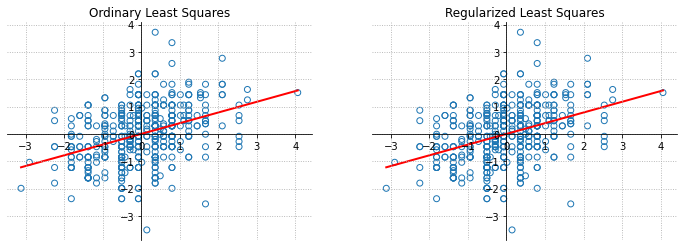

In [75]:
def regularized_least_squares(A, b, lbda=0):
    m, n = A.shape
    I = np.eye(n)
    x_hat = np.linalg.inv(A.T @ A + lbda * I) @ A.T @ b
    return x_hat

# center data to have 0 mean and unit variance
x_c = (x - x.mean()) / x.std()
y_c = (y - y.mean()) / y.std()

# configure plots
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
for ax in axs:
    stylize_plot(ax, xlim=None, ylim=None)
    ax.scatter(x_c, y_c, s=36, edgecolor='tab:blue', facecolor='None')

# find solutions
x_ols = regularized_least_squares(x_c[:, None], y_c)
x_rls = regularized_least_squares(x_c[:, None], y_c, lbda=0.01)

# plot lines
pts = np.linspace(x_c.min(), x_c.max(), 10)
axs[0].plot(pts, x_ols * pts, ls='-', color='r', linewidth=2, zorder=1)
axs[0].set_title('Ordinary Least Squares')
axs[1].plot(pts, x_rls * pts, ls='-', color='r', linewidth=2, zorder=1)
axs[1].set_title('Regularized Least Squares')

One last curiosity:

In [76]:
print('Slope of x_ols: {:.8f}'.format(x_ols[0]))
print('Slope of x_rls: {:.8f}'.format(x_rls[0]))
print('Correlation between x and y: {:.8f}'.format(np.corrcoef(x, y)[0,1]))

Slope of x_ols: 0.39131736
Slope of x_rls: 0.39130894
Correlation between x and y: 0.39131736


So, the slope given by the ordinary least squares solution (with normalized data) is equal to the correlation between $x$ and $y$.

<br>
<center>
    <b>Exercises:</b><br> 
    (1) Try playing with a different dataset, or with different columns of the Galton dataset. <br>
    (2) Study the function <a href="https://numpy.org/doc/stable/reference/generated/numpy.linalg.lstsq.html">`numpy.linalg.lstsq`</a>. How to add ridge regularization it?
</center>

---
# Least Norm Estimation

### Solving underconstrained systems

Let's consider the setting where $m < n$. That is, when we have more features than samples. We also summe that the rows of $\bm{A}$ are linearly independent, so $\bm{A}$ is full rank.

We know that when $m < n$ there are $\infty$ solutions to $\bm{A}\bm{x} = \bm{b}$, which have the form:

$$
\{\bm{x}: \bm{A}\bm{x} = \bm{b}\} = \{\bm{x}^\star + \bm{z}: \bm{z} \in \text{nullspace}(\bm{A})\}
$$

where $\bm{x}^\star$ is any possible solution. Since there are many solutions, we usually pick a particular solution with minimal $\ell_2$ norm:

$$
\hat{\bm{x}} = \argmin_\bm{x} \|\bm{x}\|_2^2 \, \text{ s.t. } \, \bm{A}\bm{x} = \bm{b}
$$

We can compute the minimal norm solution using the right pseudo inverse (which can be derived from the SVD factorization of $\bm{A}$):

$$
\bm{x}_{pinv} = \bm{A}^\top(\bm{A}\bm{A}^\top)^{-1}\bm{b}
$$

In [77]:
df_third_family = df[df['family'] == '3']
df_third_family

,family,father,mother,gender,height,kids,male,female
8,3,190.5,162.56,M,180.34,2,1.0,0.0
9,3,190.5,162.56,F,172.72,2,0.0,1.0


In [78]:
A = df_third_family[['father', 'mother', 'kids', 'male']].to_numpy()
b = df_third_family[['height']].to_numpy()

# Singular matrix error:
# x_ols = regularized_least_squares(A, b)
# print(x_ols)

x_rls = regularized_least_squares(A, b, lbda=0.1)
print(x_rls.T)

x_least_norm = A.T @ np.linalg.inv(A @ A.T) @ b
print(x_least_norm.T)

[[5.26531845e-01 4.49307175e-01 5.52789339e-03 6.35023033e+00]]
[[5.24603924e-01 4.47662015e-01 5.50765275e-03 7.62000000e+00]]


<center>
    <b>Exercise:</b><br> 
    Try playing with `lbda` above. What happens when $\lambda \to \infty$? and when $\lambda \to 0$?
</center>